In [1]:
import plot
import importlib
import numpy as np
import random
import os
import glob
import h5py
import math
import scipy
import random
import classify
import warnings
import preprocess
import matplotlib
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
from os import path
from scipy import stats
from scipy.io import loadmat
from matplotlib import gridspec
from numpy.linalg import norm
from scipy.spatial import distance
from sklearn import decomposition
from matplotlib.colors import LinearSegmentedColormap
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
warnings.filterwarnings('ignore')
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

np.random.seed(42)
random.seed(42)


In [2]:

# reload when updating code
importlib.reload(preprocess)
# mouse and date

mice = ['NN11'] 
dates_per_mouse = {'NN11': ['210626']}

for mouse in mice:
    dates = dates_per_mouse[mouse]  # Get the list of dates for the current mouse
    days = len(dates)  # Correct number of days for this mouse
    
    for day_idx, date in enumerate(dates):
        print(mouse, date)
        
        # Create folders to save files
        paths = preprocess.create_folders(mouse, date)
        print('folders created')
        
        # Import data for mouse and date as dict
        session_data = preprocess.load_data(paths)
        print('data loaded')
        
        # Process and plot behavior
        behavior = preprocess.process_behavior(session_data, paths)
        print('behavior done')
        
        # Save masks so can run in Matlab to process other planes
        # preprocess.cell_masks(paths, 0)
        print('masks saved')
        
        # Grab activity
        deconvolved = preprocess.process_activity(paths, 'spks', 3, 0)
        print('activity processed')
        
        # Normalize activity
        norm_deconvolved = preprocess.normalize_deconvolved(deconvolved, behavior, paths, 0)
        print('activity normalized')
        
        # Gaussian filter activity
        norm_moving_deconvolved_filtered = preprocess.difference_gaussian_filter(norm_deconvolved, 4, behavior, paths, 0)
        print('activity filtered')
        
        # Make trial-averaged traces and baseline subtract
        mean_cs_1_responses_df = preprocess.normalized_trial_averaged(norm_deconvolved, behavior, 'cs_1')
        mean_cs_2_responses_df = preprocess.normalized_trial_averaged(norm_deconvolved, behavior, 'cs_2')
        print('traces done')
        
        # Get significant cells
        [cs_1_poscells, cs_1_negcells] = preprocess.sig_test(norm_deconvolved, behavior, 'cs_1')
        [cs_2_poscells, cs_2_negcells] = preprocess.sig_test(norm_deconvolved, behavior, 'cs_2')
        [both_poscells, both_sigcells] = preprocess.combine_sig(cs_1_poscells, cs_1_negcells, cs_2_poscells, cs_2_negcells)
        print('sig cells done')
        
        # Get index of top cell differences
        idx = preprocess.get_index(behavior, mean_cs_1_responses_df, mean_cs_2_responses_df, cs_1_poscells, cs_2_poscells, both_poscells, both_sigcells, paths, 1)
        print('idx done')
        
        # Get prior for synchronous cue activity
        prior = classify.prior(norm_moving_deconvolved_filtered, idx['cs_1'], idx['cs_2'], behavior, [])
        print('prior done')
        
        # Logistic regression
        y_pred_log = classify.log_regression(behavior, norm_deconvolved, norm_moving_deconvolved_filtered, both_poscells, prior)
        print('logistic regression done')
        
        # Process classified output
        y_pred = classify.process_classified(y_pred_log, prior, paths, 1)
        print('classified done')
    


NN11 210626
folders created
data loaded
behavior done
masks saved
activity processed
activity normalized
activity filtered
traces done
sig cells done
idx done
prior done
logistic regression done
classified done


In [177]:
activity = norm_deconvolved.to_numpy()
activity = activity[idx['both'].index]

# Commented out code for filtering significant reactivated cells.
# sig_cells = preprocess.sig_reactivated_cells([], [], [], [], [], paths, 0)
# activity = activity[sig_cells > 0, :]

# Initialize lists to store mean activities and onsets for two different cues.
mean_activity_cs_1 = []
mean_activity_cs_2 = []
mean_activity_cs_any = []
onsets_cs_1 = []
onsets_cs_2 = []

# Loop over each onset and offset in behavior data.
for i in range(0, len(behavior['onsets'])):
    # Calculate the mean activity for the given onset to offset period.
    temp_activity = np.mean(activity[:, int(behavior['onsets'][i]):int(behavior['offsets'][i]) + 1], axis=1)
    # Check if the cue code matches cs_1_code, and store the mean activity and onset.
    if behavior['cue_codes'][i] == behavior['cs_1_code']:
        mean_activity_cs_1.append(temp_activity)
        onsets_cs_1.append(behavior['onsets'][i])
        mean_activity_cs_any.append(temp_activity)
    # Check if the cue code matches cs_2_code, and store the mean activity and onset.
    if behavior['cue_codes'][i] == behavior['cs_2_code']:
        mean_activity_cs_2.append(temp_activity)
        onsets_cs_2.append(behavior['onsets'][i])
        mean_activity_cs_any.append(temp_activity)

print(len(mean_activity_cs_1)) #trials x neurons

68


In [178]:
import numpy as np
cos_sim = lambda a, b: np.dot(a, b) / (np.linalg.norm(a) * np.linalg.norm(b))
topn = 0.05

# Commented out code for filtering significant reactivated cells.
# sig_cells = preprocess.sig_reactivated_cells([], [], [], [], [], paths, 0)
# activity = activity[sig_cells > 0, :]

# Initialize lists to store mean activities and onsets for two different cues.
mean_activity_cs_1 = []
mean_activity_cs_2 = []
mean_activity_cs_any = []
onsets_cs_1 = []
onsets_cs_2 = []

# Loop over each onset and offset in behavior data.
for i in range(0, len(behavior['onsets'])):
    # Calculate the mean activity for the given onset to offset period.
    temp_activity = np.mean(activity[:, int(behavior['onsets'][i]):int(behavior['offsets'][i]) + 1], axis=1)
    # Check if the cue code matches cs_1_code, and store the mean activity and onset.
    if behavior['cue_codes'][i] == behavior['cs_1_code']:
        mean_activity_cs_1.append(temp_activity)
        onsets_cs_1.append(behavior['onsets'][i])
        mean_activity_cs_any.append(temp_activity)
    # Check if the cue code matches cs_2_code, and store the mean activity and onset.
    if behavior['cue_codes'][i] == behavior['cs_2_code']:
        mean_activity_cs_2.append(temp_activity)
        onsets_cs_2.append(behavior['onsets'][i])
        mean_activity_cs_any.append(temp_activity)

# Normalize the mean activities for each trial.
mean_activity_cs_1 = mean_activity_cs_1 / np.mean(mean_activity_cs_any, axis=0)
mean_activity_cs_2 = mean_activity_cs_2 / np.mean(mean_activity_cs_any, axis=0)

mean_activity_cs_1 = np.stack(mean_activity_cs_1, axis=0)
mean_activity_cs_2 = np.stack(mean_activity_cs_2, axis=0)

# Calculate the mean of the first and last three mean activities for cs_1 and cs_2.
n_centroids = 3
mean_activity_cs_1_mean = [np.mean(mean_activity_cs_1[0:n_centroids], axis=0), np.mean(mean_activity_cs_1[len(mean_activity_cs_1) - n_centroids:len(mean_activity_cs_1)], axis=0)]
mean_activity_cs_2_mean = [np.mean(mean_activity_cs_2[0:n_centroids], axis=0), np.mean(mean_activity_cs_2[len(mean_activity_cs_2) - n_centroids:len(mean_activity_cs_2)], axis=0)]

# Calculate the difference vectors between the early and late mean activities for cs_1 and cs_2.
mean_activity_cs_1_vec = mean_activity_cs_1_mean[1] - mean_activity_cs_1_mean[0]
mean_activity_cs_2_vec = mean_activity_cs_2_mean[1] - mean_activity_cs_2_mean[0]

late_trails_1 = mean_activity_cs_1_mean[1]
top_n_percent_indices_1 = np.argsort(late_trails_1)[-int(len(late_trails_1) * topn):]
mean_activity_cstopn_1 = mean_activity_cs_1[:, top_n_percent_indices_1]
mean_activity_cstopn_1_late = mean_activity_cs_1_mean[1][top_n_percent_indices_1]

late_trails_2 = mean_activity_cs_2_mean[1]
top_n_percent_indices_2 = np.argsort(late_trails_2)[-int(len(late_trails_2) * topn):]
mean_activity_cstopn_2 = mean_activity_cs_2[:, top_n_percent_indices_2]
mean_activity_cstopn_2_late = mean_activity_cs_2_mean[1][top_n_percent_indices_2]

sim_cs_1 = np.zeros(len(mean_activity_cs_1))
sim_cs_2 = np.zeros(len(mean_activity_cs_2))

# Normalize the mean activities for each trial using the difference vectors.
for i in range(0, len(mean_activity_cs_1)):
    sim_cs_1[i] = cos_sim(mean_activity_cstopn_1[i], mean_activity_cstopn_1_late)
    # sim_cs_1[i] = cos_sim(mean_activity_cs_1[i], mean_activity_cs_1_mean[1])
    # sim_cs_1[i] = np.dot(mean_activity_cs_1[i], mean_activity_cs_1_vec) / np.linalg.norm(mean_activity_cs_1_vec)
for i in range(0, len(mean_activity_cs_2)):
    sim_cs_2[i] = cos_sim(mean_activity_cstopn_2[i], mean_activity_cstopn_2_late)
    # sim_cs_2[i] = cos_sim(mean_activity_cs_2[i], mean_activity_cs_2_mean[1])
    # sim_cs_2[i] = np.dot(mean_activity_cs_2[i], mean_activity_cs_2_vec) / np.linalg.norm(mean_activity_cs_2_vec)


In [179]:

# Initialize lists to store mean activities and trial indices for reactivation events.
mean_activity_r_1 = []
mean_activity_r_2 = []
mean_activity_r_any = []
trial_r_1 = []
trial_r_2 = []

# Copy reactivation predictions for cs_1 and cs_2.
reactivation_cs_1 = y_pred[:, 0].copy()
reactivation_cs_2 = y_pred[:, 1].copy()

# Set a threshold for reactivation probability.
p_threshold = .75

# Initialize variables for reactivation event detection.
cs_1_peak = 0
cs_2_peak = 0
i = 0
next_r = 0

# Loop through reactivation predictions to detect reactivation events.
while i < len(reactivation_cs_1) - 1:
    # Check if there is a reactivation event.
    if reactivation_cs_1[i] > 0 or reactivation_cs_2[i] > 0:
        if next_r == 0:
            r_start = i
            next_r = 1
        # Update peak reactivation values.
        if reactivation_cs_1[i] > cs_1_peak:
            cs_1_peak = reactivation_cs_1[i]
        if reactivation_cs_2[i] > cs_2_peak:
            cs_2_peak = reactivation_cs_2[i]
        #print(reactivation_cs_1[i + 1], reactivation_cs_2[i + 1])
        # Check if the reactivation event has ended.
        if reactivation_cs_1[i + 1] <= 0.001 and reactivation_cs_2[i + 1]<= 0.001:
            r_end = i + 1
            next_r = 0
            # Store mean activity and trial index for cs_1 reactivation events above the threshold.
            if cs_1_peak > p_threshold:
                for j in range(0, len(onsets_cs_1)):
                    if r_start < onsets_cs_1[j] and r_start > onsets_cs_1[j-1] and r_start < onsets_cs_1[j-1] + int(behavior['framerate']*61):
                        mean_activity_r_1.append(np.mean(activity[:, r_start:r_end], axis=1))
                        trial_r_1.append(j-1)
                        mean_activity_r_any.append(np.mean(activity[:, r_start:r_end], axis=1))
                        break
            # Store mean activity and trial index for cs_2 reactivation events above the threshold.
            if cs_2_peak > p_threshold:
                for j in range(0, len(onsets_cs_2)):
                    if r_start < onsets_cs_2[j] and r_start > onsets_cs_2[j-1] and r_start < onsets_cs_2[j-1] + int(behavior['framerate']*61):
                        mean_activity_r_2.append(np.mean(activity[:, r_start:r_end], axis=1))
                        trial_r_2.append(j-1)
                        mean_activity_r_any.append(np.mean(activity[:, r_start:r_end], axis=1))
                        break
            # Reset variables for the next reactivation event.
            i = r_end
            cs_1_peak = 0
            cs_2_peak = 0
    i += 1


In [180]:

# Normalize the reactivation mean activities.
# mean_activity_r_1 = mean_activity_r_1 / np.mean(mean_activity_r_any, axis=0)
# mean_activity_r_2 = mean_activity_r_2 / np.mean(mean_activity_r_any, axis=0)

mean_activity_r_1 = np.stack(mean_activity_r_1, axis=0)
mean_activity_r_2 = np.stack(mean_activity_r_2, axis=0)

# mean_activity_rtopn_1 = mean_activity_r_1[:, top_n_percent_indices_1]
# mean_activity_cstopn_1_late = mean_activity_cs_1_mean[1][top_n_percent_indices_1]

# mean_activity_rtopn_2 = mean_activity_r_2[:, top_n_percent_indices_2]
# mean_activity_cstopn_2_late = mean_activity_cs_2_mean[1][top_n_percent_indices_2]

sim_r_1 = np.zeros(len(mean_activity_r_1))
sim_r_2 = np.zeros(len(mean_activity_r_2))

sim_r_1_random = np.zeros(len(mean_activity_r_1))

zero_indices = np.where(mean_activity_r_1 != 0)
    
# Normalize the reactivation mean activities using the difference vectors.
for i in range(0, len(mean_activity_r_1)):
    # nonzero_indices = np.where(mean_activity_r_1[i] != 0)
    top_n_percent_indices_r_1 = np.argsort(mean_activity_r_1[i])[-int(len(mean_activity_r_1[i]) * topn):]
    sim_r_1[i] = cos_sim(mean_activity_r_1[i][np.intersect1d(top_n_percent_indices_r_1, top_n_percent_indices_1)], mean_activity_cs_1_mean[1][np.intersect1d(top_n_percent_indices_r_1, top_n_percent_indices_1)])
    
    chosen_indices = np.random.randint(0, len(mean_activity_r_1[i]), 27)
    sim_r_1_random[i] = cos_sim(mean_activity_r_1[i][chosen_indices], mean_activity_cs_1_mean[1][chosen_indices])
    # sim_r_1[i] = cos_sim(mean_activity_rtopn_1[i], mean_activity_cstopn_1_late)
    # sim_r_1[i] = cos_sim(mean_activity_r_1[i], mean_activity_cs_1_mean[1])
    # sim_r_1[i] = np.dot(mean_activity_r_1[i], mean_activity_cs_1_vec) / np.linalg.norm(mean_activity_cs_1_vec)
for i in range(0, len(mean_activity_r_2)):
    # nonzero_indices = np.where(mean_activity_r_2[i] != 0)
    top_n_percent_indices_r_2 = np.argsort(mean_activity_r_2[i])[-int(len(mean_activity_r_2[i]) * topn):]
    sim_r_2[i] = cos_sim(mean_activity_r_2[i][np.intersect1d(top_n_percent_indices_r_2, top_n_percent_indices_2)], mean_activity_cs_2_mean[1][np.intersect1d(top_n_percent_indices_r_2, top_n_percent_indices_2)])
    # sim_r_2[i] = cos_sim(mean_activity_rtopn_2[i], mean_activity_cstopn_2_late)
    # sim_r_2[i] = cos_sim(mean_activity_r_2[i], mean_activity_cs_2_mean[1])
    # sim_r_2[i] = np.dot(mean_activity_r_2[i], mean_activity_cs_2_vec) / np.linalg.norm(mean_activity_cs_2_vec)

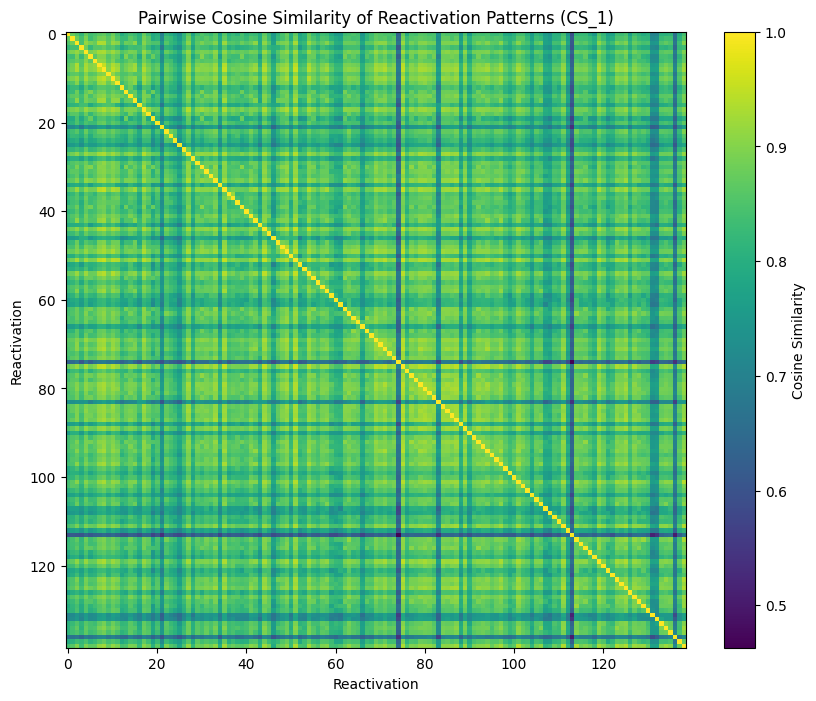

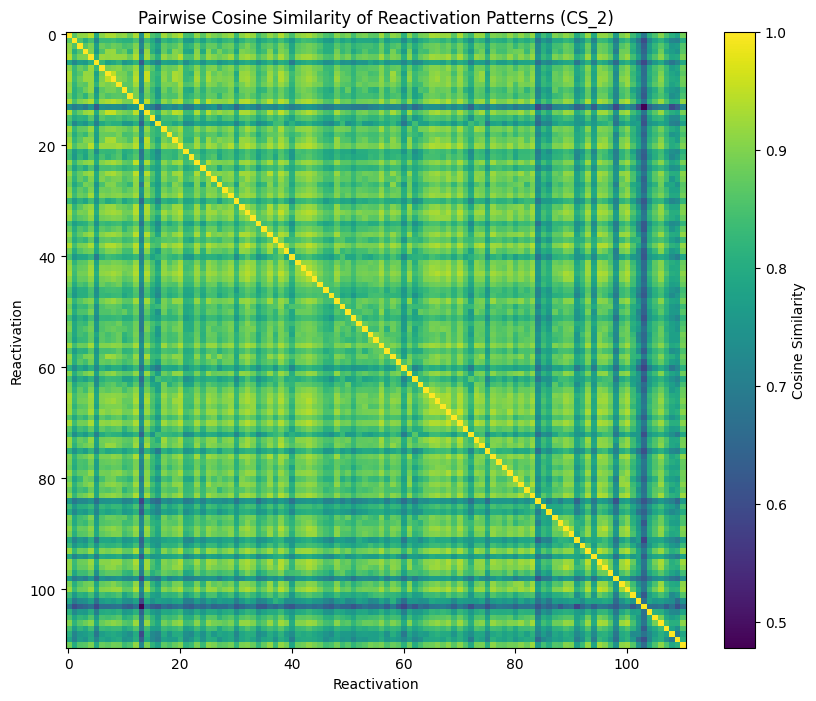

In [103]:
from sklearn.metrics.pairwise import cosine_similarity

# Compute pairwise cosine similarity of reactivation patterns
similarity_matrix_cs_1 = cosine_similarity(mean_activity_r_1)
similarity_matrix_cs_2 = cosine_similarity(mean_activity_r_2)

plt.figure(figsize=(10, 8))
plt.title("Pairwise Cosine Similarity of Reactivation Patterns (CS_1)")
plt.imshow(similarity_matrix_cs_1, cmap="viridis", aspect="auto")
plt.colorbar(label="Cosine Similarity")
plt.xlabel("Reactivation")
plt.ylabel("Reactivation")
plt.show()

plt.figure(figsize=(10, 8))
plt.title("Pairwise Cosine Similarity of Reactivation Patterns (CS_2)")
plt.imshow(similarity_matrix_cs_2, cmap="viridis", aspect="auto")
plt.colorbar(label="Cosine Similarity")
plt.xlabel("Reactivation")
plt.ylabel("Reactivation")
plt.show()



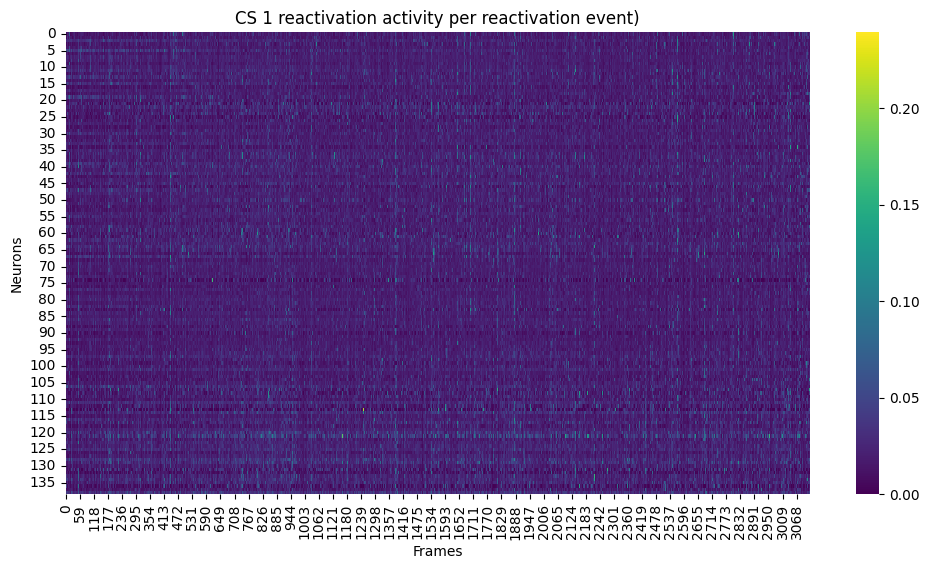

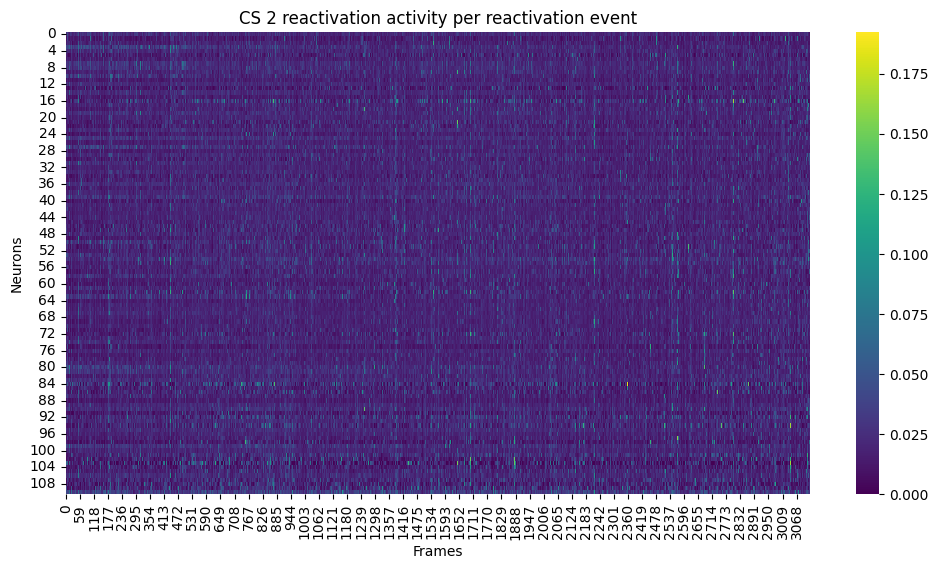

In [104]:

# Heatmap for CS_1 Reactivations
plt.figure(figsize=(12, 6))
sns.heatmap(mean_activity_r_1, cmap="viridis", cbar=True)
plt.title("CS 1 reactivation activity per reactivation event)")
plt.xlabel("Frames")
plt.ylabel("Neurons")
plt.show()

# Heatmap for CS_2 Reactivations
plt.figure(figsize=(12, 6))
sns.heatmap(mean_activity_r_2, cmap="viridis", cbar=True)
plt.title("CS 2 reactivation activity per reactivation event")
plt.xlabel("Frames")
plt.ylabel("Neurons")
plt.show()


# Structural Analysis of Reactivations

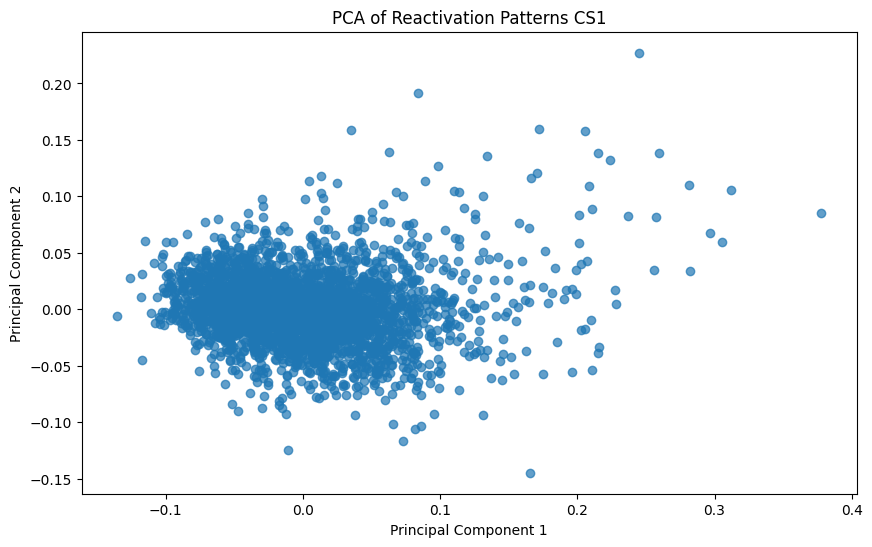

[0.16898446 0.05191164]


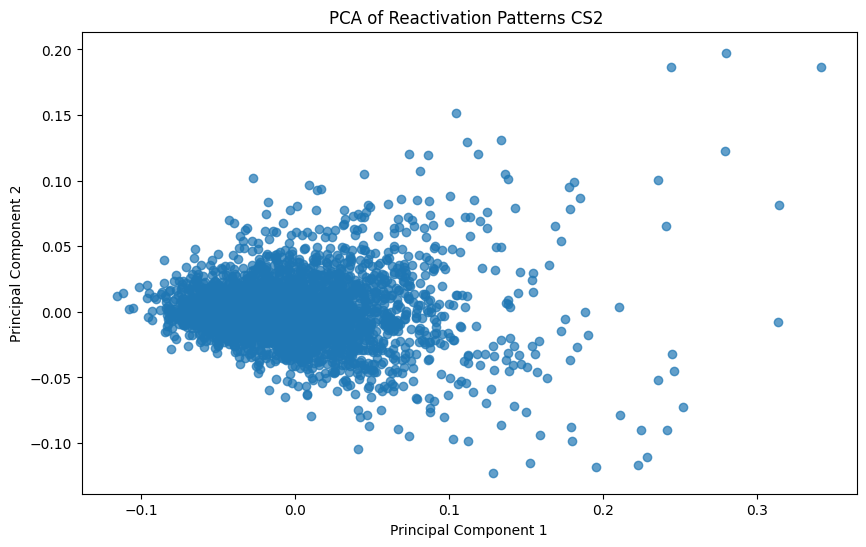

[0.1806232  0.04980929]


In [105]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
reactivations_pca1 = pca.fit_transform(mean_activity_r_1.T)

# Plot the first two principal components
plt.figure(figsize=(10, 6))
plt.scatter(reactivations_pca1[:, 0], reactivations_pca1[:, 1], alpha=0.7)
plt.title("PCA of Reactivation Patterns CS1")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.show()

print(pca.explained_variance_ratio_)

reactivations_pca2 = pca.fit_transform(mean_activity_r_2.T)

# Plot the first two principal components
plt.figure(figsize=(10, 6))
plt.scatter(reactivations_pca2[:, 0], reactivations_pca2[:, 1], alpha=0.7)
plt.title("PCA of Reactivation Patterns CS2 ")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.show()

print(pca.explained_variance_ratio_)

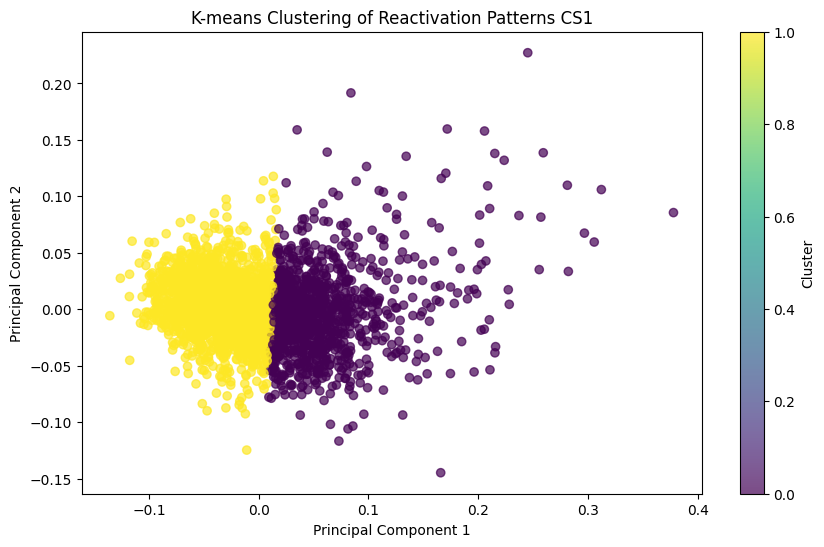

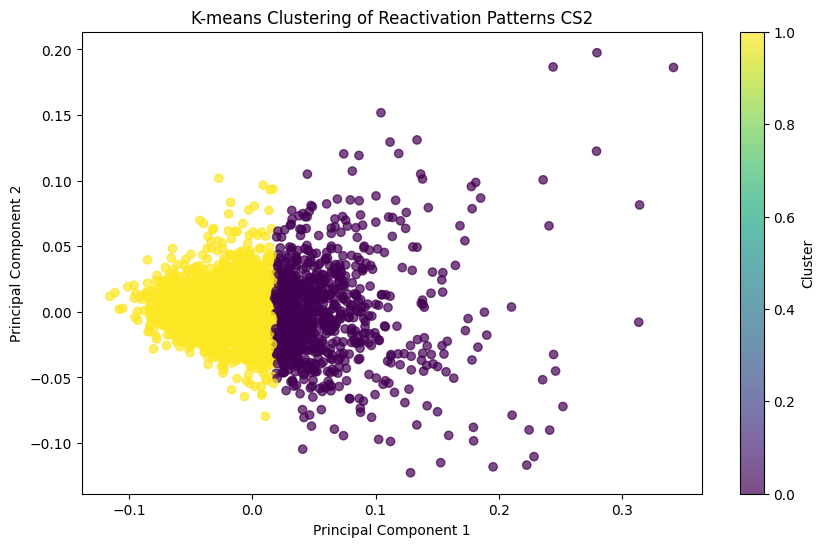

In [106]:
from sklearn.cluster import KMeans

# Apply K-means clustering
kmeans = KMeans(n_clusters=2, random_state=42)
clusters = kmeans.fit_predict(reactivations_pca1)

# Plot clusters
plt.figure(figsize=(10, 6))
plt.scatter(reactivations_pca1[:, 0], reactivations_pca1[:, 1], c=clusters, cmap="viridis", alpha=0.7)
plt.title("K-means Clustering of Reactivation Patterns CS1")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.colorbar(label="Cluster")
plt.show()

kmeans = KMeans(n_clusters=2, random_state=42)
clusters = kmeans.fit_predict(reactivations_pca2)

# Plot clusters
plt.figure(figsize=(10, 6))
plt.scatter(reactivations_pca2[:, 0], reactivations_pca2[:, 1], c=clusters, cmap="viridis", alpha=0.7)
plt.title("K-means Clustering of Reactivation Patterns CS2")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.colorbar(label="Cluster")
plt.show()



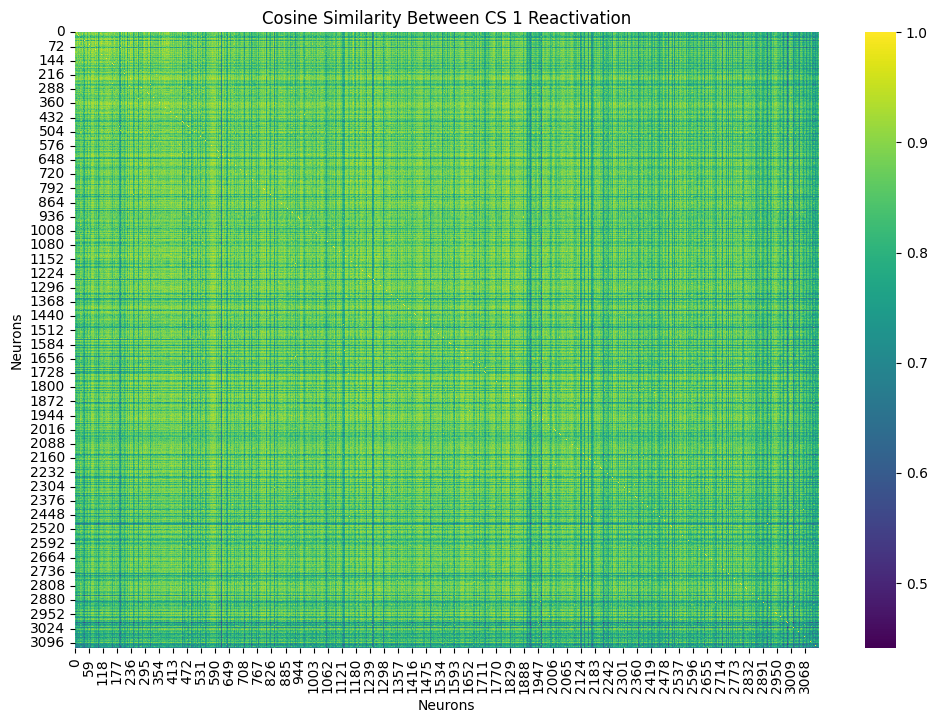

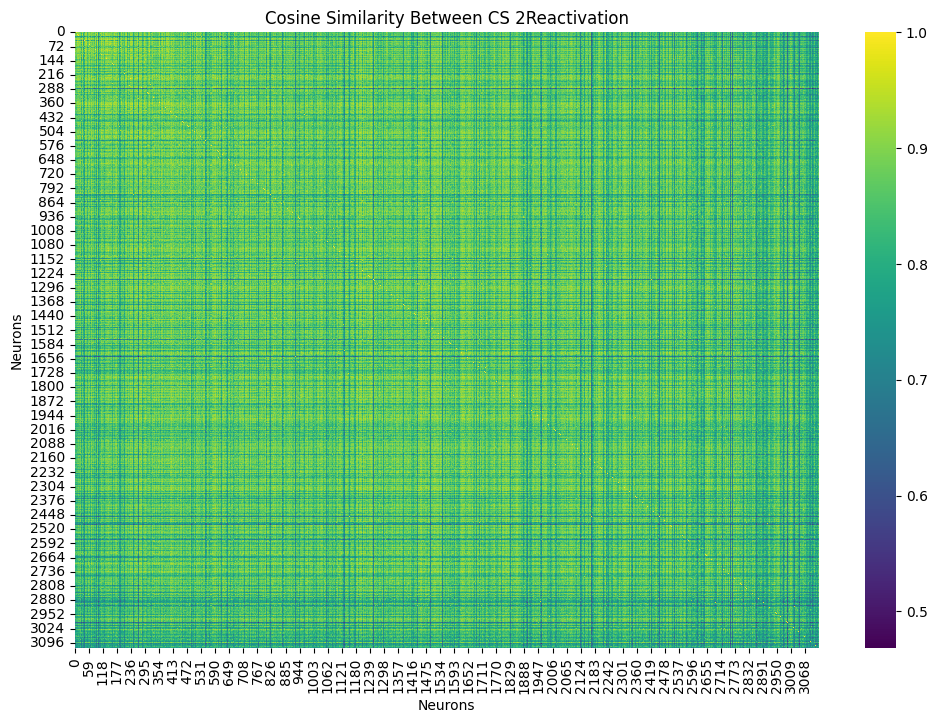

In [107]:
from sklearn.metrics.pairwise import cosine_similarity

# Compute cosine similarity
similarity_matrix1 = cosine_similarity(mean_activity_r_1.T)

# Plot similarity matrix
plt.figure(figsize=(12, 8))
sns.heatmap(similarity_matrix1, cmap="viridis", cbar=True)
plt.title("Cosine Similarity Between CS 1 Reactivation")
plt.xlabel("Neurons")
plt.ylabel("Neurons")
plt.show()

# Compute cosine similarity
similarity_matrix2 = cosine_similarity(mean_activity_r_2.T)

# Plot similarity matrix
plt.figure(figsize=(12, 8))
sns.heatmap(similarity_matrix2, cmap="viridis", cbar=True)
plt.title("Cosine Similarity Between CS 2Reactivation")
plt.xlabel("Neurons")
plt.ylabel("Neurons")
plt.show()



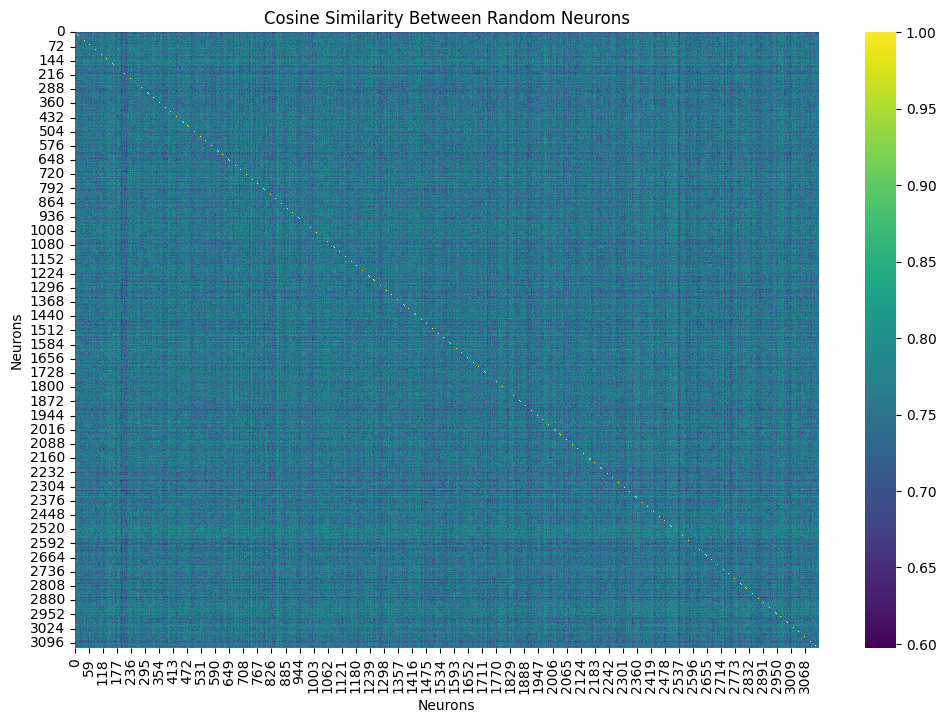

In [86]:
# Generate random data
random_data = np.random.rand(*mean_activity_r_1.shape)

# Compute cosine similarity for random data
random_similarity_matrix = cosine_similarity(random_data.T)

# Plot random similarity matrix
plt.figure(figsize=(12, 8))
sns.heatmap(random_similarity_matrix, cmap="viridis", cbar=True)
plt.title("Cosine Similarity Between Random Neurons")
plt.xlabel("Neurons")
plt.ylabel("Neurons")
plt.show()


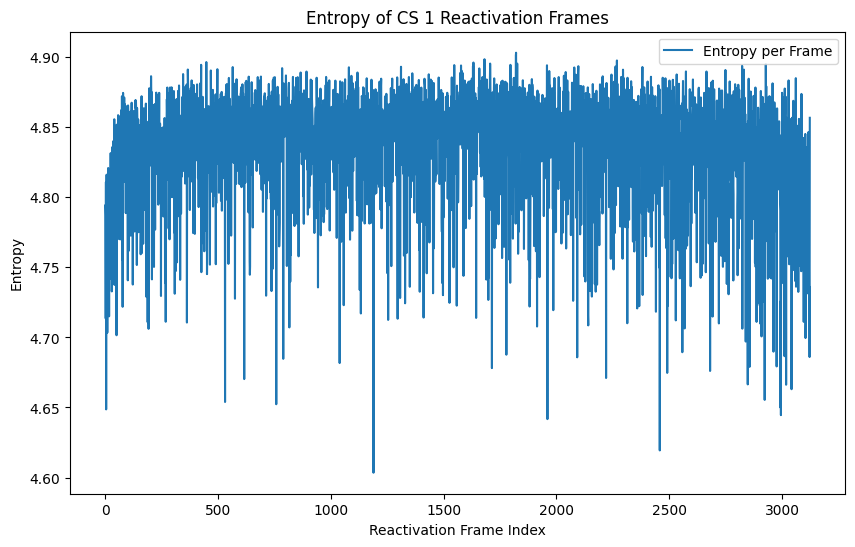

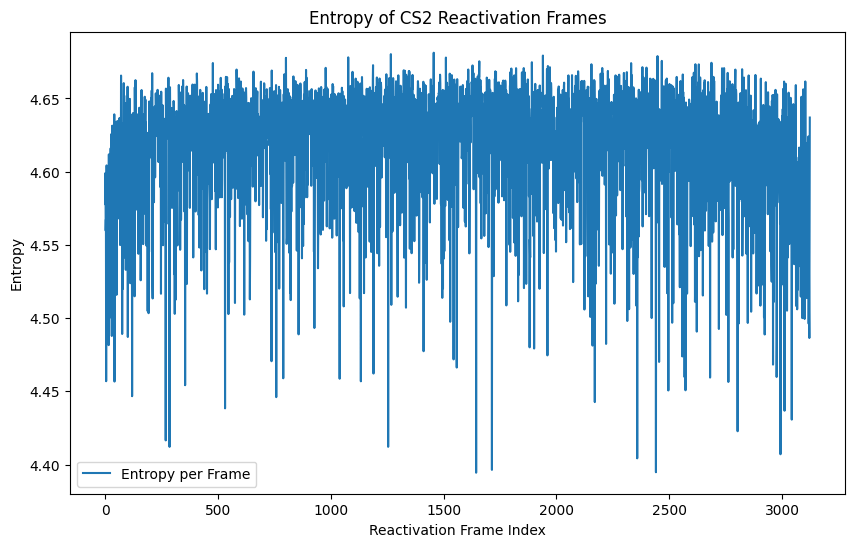

In [108]:
from scipy.stats import entropy

# Compute entropy for each frame
frame_entropy = entropy(mean_activity_r_1, axis=0)

# Plot entropy
plt.figure(figsize=(10, 6))
plt.plot(frame_entropy, label="Entropy per Frame")
plt.title("Entropy of CS 1 Reactivation Frames")
plt.xlabel("Reactivation Frame Index")
plt.ylabel("Entropy")
plt.legend()
plt.show()

from scipy.stats import entropy

frame_entropy = entropy(mean_activity_r_2, axis=0)

# Plot entropy
plt.figure(figsize=(10, 6))
plt.plot(frame_entropy, label="Entropy per Frame")
plt.title("Entropy of CS2 Reactivation Frames")
plt.xlabel("Reactivation Frame Index")
plt.ylabel("Entropy")
plt.legend()
plt.show()



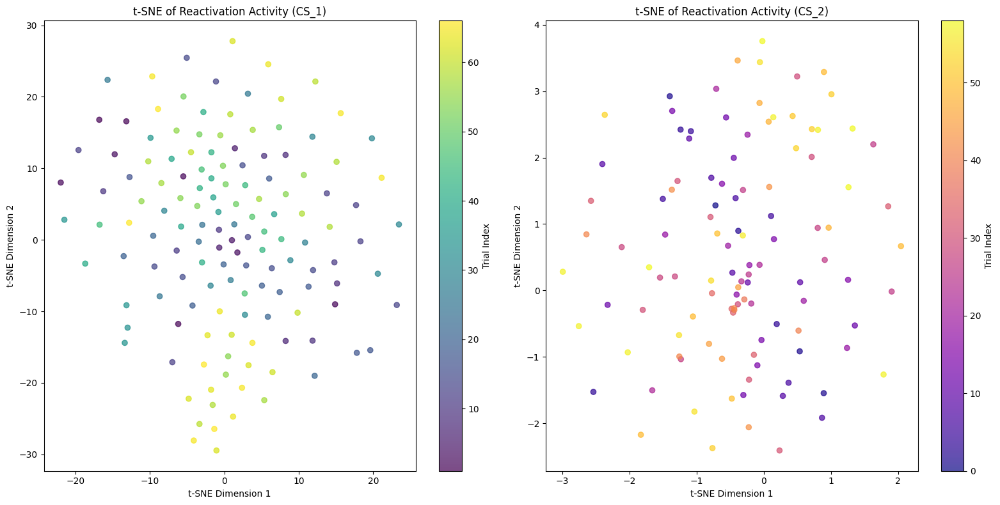

In [109]:
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

# Standardize CS_1 and CS_2 separately
scaler = StandardScaler()
standardized_r_1 = scaler.fit_transform(mean_activity_r_1)
standardized_r_2 = scaler.fit_transform(mean_activity_r_2)

# Apply t-SNE separately to CS_1 and CS_2
tsne_cs_1 = TSNE(n_components=2, perplexity=30, random_state=42).fit_transform(standardized_r_1)
tsne_cs_2 = TSNE(n_components=2, perplexity=30, random_state=42).fit_transform(standardized_r_2)

# Plotting
plt.figure(figsize=(16, 8))

# Subplot 1: CS_1 Reactivations
plt.subplot(1, 2, 1)
scatter_cs_1 = plt.scatter(
    tsne_cs_1[:, 0], tsne_cs_1[:, 1],
    c=trial_r_1, cmap='viridis', alpha=0.7
)
plt.colorbar(scatter_cs_1, label="Trial Index")
plt.title("t-SNE of Reactivation Activity (CS_1)")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")

# Subplot 2: CS_2 Reactivations
plt.subplot(1, 2, 2)
scatter_cs_2 = plt.scatter(
    tsne_cs_2[:, 0], tsne_cs_2[:, 1],
    c=trial_r_2, cmap='plasma', alpha=0.7
)
plt.colorbar(scatter_cs_2, label="Trial Index")
plt.title("t-SNE of Reactivation Activity (CS_2)")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")

plt.tight_layout()
plt.show()


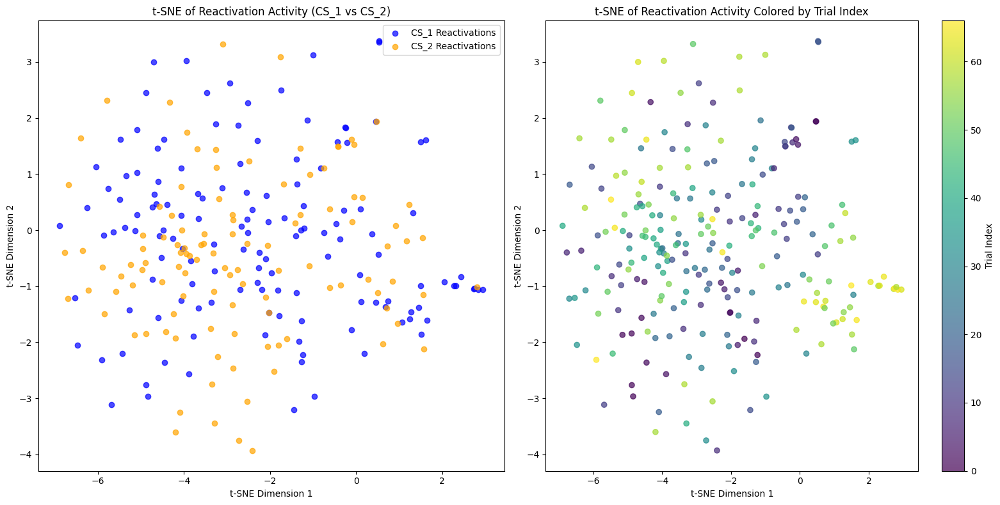

In [110]:
# Combine data for CS_1 and CS_2
combined_data = np.vstack([mean_activity_r_1, mean_activity_r_2])  # Shape: (total_reactivations, neurons)
combined_trial_indices = np.hstack([trial_r_1, trial_r_2])  # Combine trial indices
labels = np.array([0] * len(mean_activity_r_1) + [1] * len(mean_activity_r_2))  # 0 for CS_1, 1 for CS_2

# Standardize the data
scaler = StandardScaler()
standardized_data = scaler.fit_transform(combined_data)

# Perform t-SNE
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_results = tsne.fit_transform(standardized_data)  # Shape: (total_reactivations, 2)

# Plotting
plt.figure(figsize=(16, 8))

# Subplot 1: CS_1 vs CS_2 Reactivations
plt.subplot(1, 2, 1)
for label, color, name in zip([0, 1], ['blue', 'orange'], ['CS_1', 'CS_2']):
    plt.scatter(
        tsne_results[labels == label, 0],
        tsne_results[labels == label, 1],
        alpha=0.7,
        label=f'{name} Reactivations',
        color=color
    )
plt.title("t-SNE of Reactivation Activity (CS_1 vs CS_2)")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.legend()

# Subplot 2: Color by Trial Index
plt.subplot(1, 2, 2)
scatter = plt.scatter(
    tsne_results[:, 0],
    tsne_results[:, 1],
    c=combined_trial_indices,
    cmap='viridis',
    alpha=0.7
)
plt.colorbar(scatter, label="Trial Index")
plt.title("t-SNE of Reactivation Activity Colored by Trial Index")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")

plt.tight_layout()
plt.show()


In [111]:
print(mean_activity_cs_1.min(), mean_activity_cs_1.max())

0.0 7.020022880523038


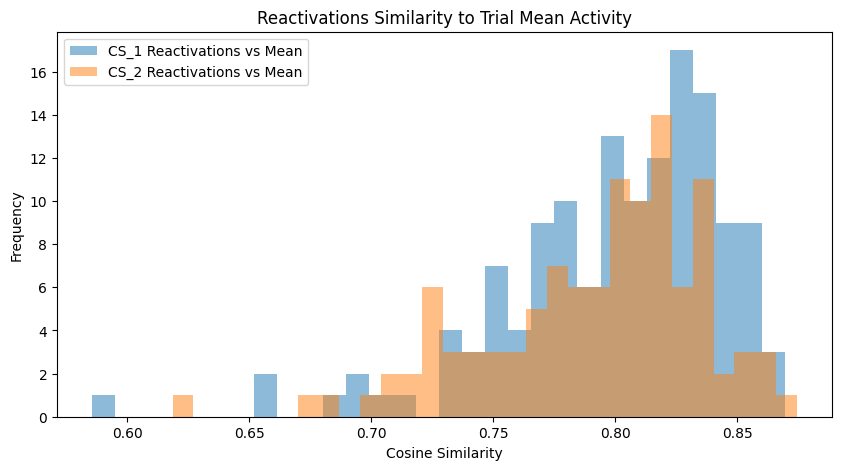

In [112]:
# Group reactivations by their trial indices for CS_1
reactivations_grouped_cs_1 = []
for trial_idx in range(len(mean_activity_cs_1)):
    # Select reactivations corresponding to this trial
    trial_reactivations = mean_activity_r_1[np.array(trial_r_1) == trial_idx, :]
    reactivations_grouped_cs_1.append(trial_reactivations)

# Group reactivations by their trial indices for CS_2
reactivations_grouped_cs_2 = []
for trial_idx in range(len(mean_activity_cs_2)):
    trial_reactivations = mean_activity_r_2[np.array(trial_r_2) == trial_idx, :]
    reactivations_grouped_cs_2.append(trial_reactivations)

# Compare reactivations to mean activity for CS_1
cs_1_similarities = []
for trial_idx in range(len(mean_activity_cs_1)):
    trial_mean = mean_activity_cs_1[trial_idx, :]  # Mean activity for the trial
    trial_reactivations = reactivations_grouped_cs_1[trial_idx]  # Reactivations in the trial
    
    if len(trial_reactivations) > 0:  # Ensure there are reactivations
        similarities = cosine_similarity(trial_reactivations, trial_mean.reshape(1, -1))
        cs_1_similarities.extend(similarities.flatten())

# Compare reactivations to mean activity for CS_2
cs_2_similarities = []
for trial_idx in range(len(mean_activity_cs_2)):
    trial_mean = mean_activity_cs_2[trial_idx, :]
    trial_reactivations = reactivations_grouped_cs_2[trial_idx]
    
    if len(trial_reactivations) > 0:
        similarities = cosine_similarity(trial_reactivations, trial_mean.reshape(1, -1))
        cs_2_similarities.extend(similarities.flatten())

# Visualize similarity distributions
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 5))
plt.hist(cs_1_similarities, bins=30, alpha=0.5, label='CS_1 Reactivations vs Mean')
plt.hist(cs_2_similarities, bins=30, alpha=0.5, label='CS_2 Reactivations vs Mean')
plt.xlabel("Cosine Similarity")
plt.ylabel("Frequency")
plt.legend()
plt.title("Reactivations Similarity to Trial Mean Activity")
plt.show()



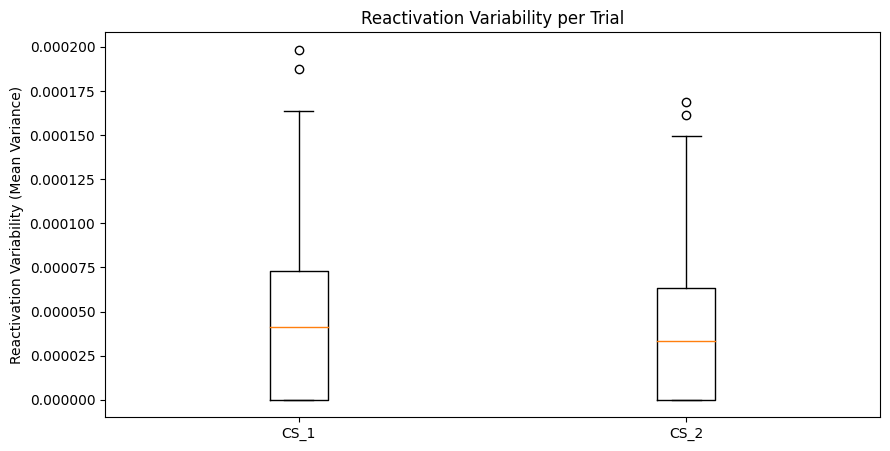

In [113]:
# Compute variability of reactivations within each trial for CS_1
cs_1_variability = []
for trial_reactivations in reactivations_grouped_cs_1:
    if len(trial_reactivations) > 0:
        variance = np.var(trial_reactivations, axis=0).mean()  # Mean variance across neurons
        cs_1_variability.append(variance)

# Compute variability of reactivations within each trial for CS_2
cs_2_variability = []
for trial_reactivations in reactivations_grouped_cs_2:
    if len(trial_reactivations) > 0:
        variance = np.var(trial_reactivations, axis=0).mean()
        cs_2_variability.append(variance)

# Visualize variability
plt.figure(figsize=(10, 5))
plt.boxplot([cs_1_variability, cs_2_variability], labels=['CS_1', 'CS_2'])
plt.ylabel("Reactivation Variability (Mean Variance)")
plt.title("Reactivation Variability per Trial")
plt.show()


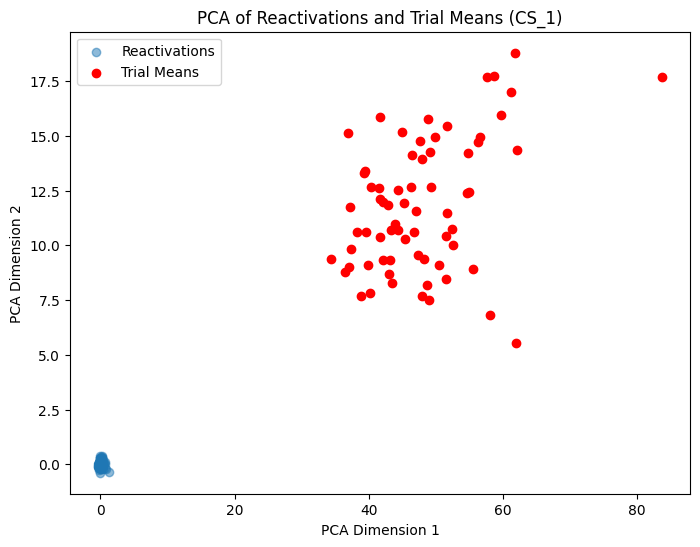

In [122]:

# Combine all reactivations for CS_1 and perform PCA
all_reactivations_cs_1 = np.vstack(mean_activity_r_1)
pca = PCA(n_components=2)
reactivation_pca1 = pca.fit_transform(all_reactivations_cs_1)

# Overlay trial means on PCA plot
trial_means_pca1 = pca.transform(mean_activity_cs_1)

# Plot
plt.figure(figsize=(8, 6))
plt.scatter(reactivation_pca1[:, 0], reactivation_pca1[:, 1], alpha=0.5, label='Reactivations')
plt.scatter(trial_means_pca1[:, 0], trial_means_pca1[:, 1], color='red', label='Trial Means')
plt.xlabel("PCA Dimension 1")
plt.ylabel("PCA Dimension 2")
plt.legend()
plt.title("PCA of Reactivations and Trial Means (CS_1)")
plt.show()


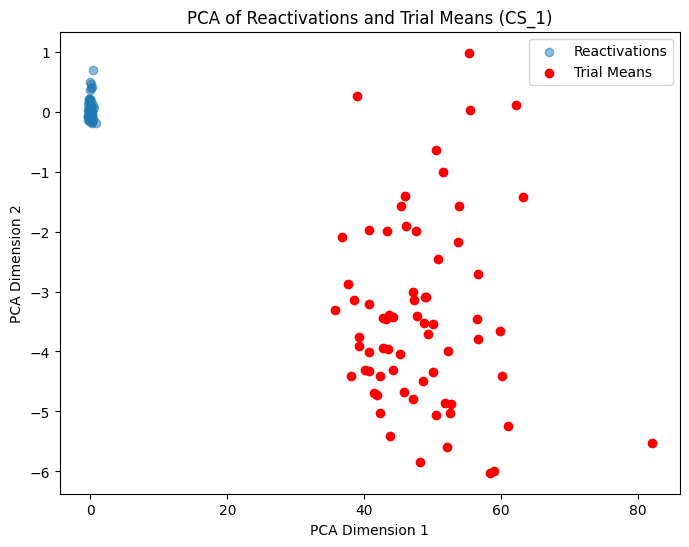

In [123]:
# Combine all reactivations for CS_1 and perform PCA
all_reactivations_cs_2 = np.vstack(mean_activity_r_2)
pca = PCA(n_components=2)
reactivation_pca2 = pca.fit_transform(all_reactivations_cs_2)

# Overlay trial means on PCA plot
trial_means_pca2 = pca.transform(mean_activity_cs_1)

# Plot
plt.figure(figsize=(8, 6))
plt.scatter(reactivation_pca2[:, 0], reactivation_pca2[:, 1], alpha=0.5, label='Reactivations')
plt.scatter(trial_means_pca2[:, 0], trial_means_pca2[:, 1], color='red', label='Trial Means')
plt.xlabel("PCA Dimension 1")
plt.ylabel("PCA Dimension 2")
plt.legend()
plt.title("PCA of Reactivations and Trial Means (CS_1)")
plt.show()

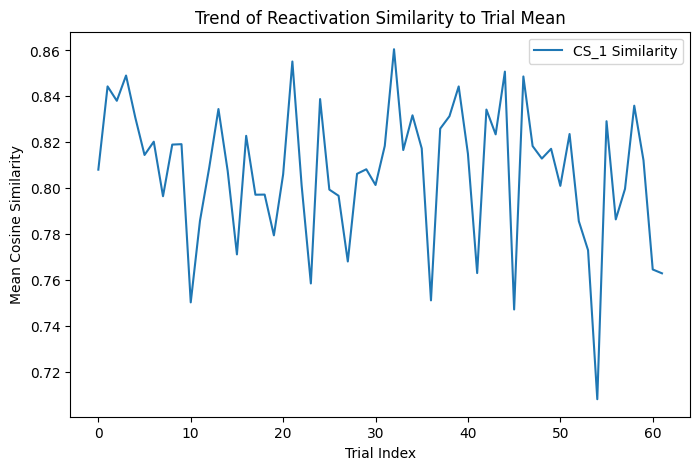

In [124]:
# Similarity trends over trials
trial_indices1 = np.array(trial_r_1)
cs_1_similarity_by_trial = []
for trial_idx in range(len(mean_activity_cs_1)):
    trial_similarities1 = [cs_1_similarities[i] for i in range(len(trial_indices1)) if trial_indices1[i] == trial_idx]
    if len(trial_similarities1) > 0:
        cs_1_similarity_by_trial.append(np.mean(trial_similarities1))

# Plot similarity trends
plt.figure(figsize=(8, 5))
plt.plot(cs_1_similarity_by_trial, label='CS_1 Similarity')
plt.xlabel("Trial Index")
plt.ylabel("Mean Cosine Similarity")
plt.title("Trend of Reactivation Similarity to Trial Mean")
plt.legend()
plt.show()


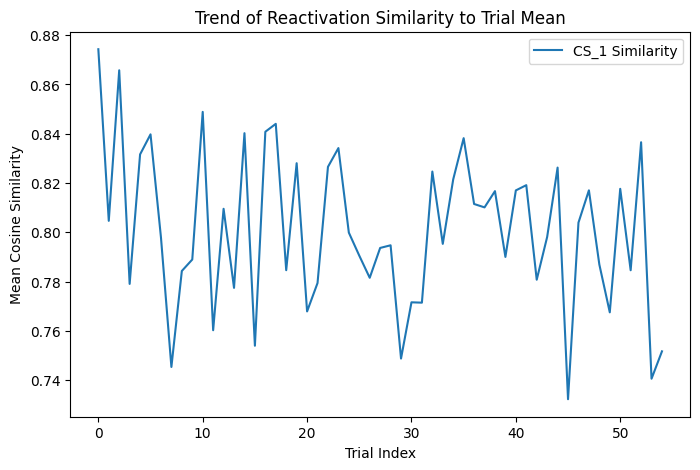

In [125]:
# Similarity trends over trials
trial_indices2 = np.array(trial_r_2)
cs_2_similarity_by_trial = []
for trial_idx in range(len(mean_activity_cs_2)):
    trial_similarities2 = [cs_2_similarities[i] for i in range(len(trial_indices2)) if trial_indices2[i] == trial_idx]
    if len(trial_similarities2) > 0:
        cs_2_similarity_by_trial.append(np.mean(trial_similarities2))

# Plot similarity trends
plt.figure(figsize=(8, 5))
plt.plot(cs_2_similarity_by_trial, label='CS_1 Similarity')
plt.xlabel("Trial Index")
plt.ylabel("Mean Cosine Similarity")
plt.title("Trend of Reactivation Similarity to Trial Mean")
plt.legend()
plt.show()


In [126]:
# Recalculate variance within clusters using the provided PCA data

# Variance for reactivations
reactivation_variance1 = np.var(reactivation_pca1, axis=0)  

# Variance for trial means
trial_mean_variance1 = np.var(trial_means_pca1, axis=0)      

# Total variance (sum of variances across PCA dimensions)
reactivation_total_variance1 = np.sum(reactivation_variance1)
trial_mean_total_variance1 = np.sum(trial_mean_variance1)

# Output the results
reactivation_variance1, trial_mean_variance1, reactivation_total_variance1, trial_mean_total_variance1


(array([0.05345272, 0.01890067]),
 array([69.45203817,  8.97877659]),
 0.07235339943464875,
 78.43081475696249)

In [127]:

# Variance for reactivations
reactivation_variance2 = np.var(reactivation_pca2, axis=0)  

# Variance for trial means
trial_mean_variance2 = np.var(trial_means_pca2, axis=0)      

# Total variance (sum of variances across PCA dimensions)
reactivation_total_variance2 = np.sum(reactivation_variance2)
trial_mean_total_variance2 = np.sum(trial_mean_variance2)

# Output the results
reactivation_variance2, trial_mean_variance2, reactivation_total_variance2, trial_mean_total_variance2


(array([0.03472387, 0.02068713]),
 array([62.29437715,  2.4098685 ]),
 0.05541100012185504,
 64.70424564826197)

     Reactivation Index  Trial Index  Similarity to Previous Trial  \
0                     0            1                      0.786246   
1                     1            1                      0.795943   
2                     2            1                      0.838692   
3                     3            2                      0.777374   
4                     4            2                      0.837013   
..                  ...          ...                           ...   
134                 134           65                      0.789430   
135                 135           66                      0.820310   
136                 136           66                      0.654708   
137                 137           66                      0.795590   
138                 138           66                      0.839732   

     Similarity to Current Trial  Similarity to Next Trial  
0                       0.788961                  0.814165  
1                       0.794914     

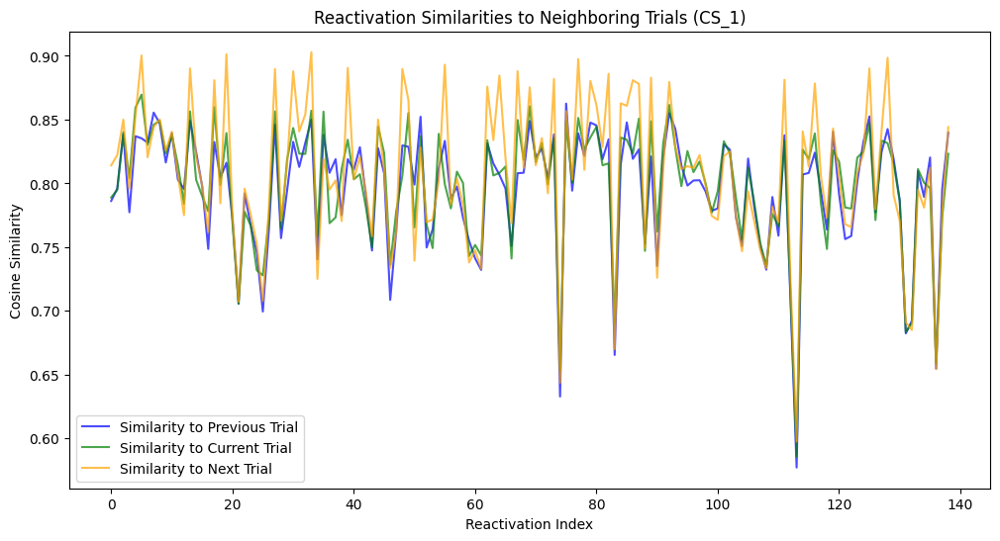

In [128]:
# Initialize lists to store similarity results
reactivation_to_trial_similarities = []

# Iterate through each reactivation
for r_idx, reactivation in enumerate(mean_activity_r_1):  # Reactivations for CS_1
    trial_idx = trial_r_1[r_idx]  # Get the trial index associated with the reactivation
    
    # Find the neighboring trials (e.g., the current, previous, and next trial means)
    previous_trial_mean = mean_activity_cs_1[trial_idx - 1] if trial_idx > 0 else None
    current_trial_mean = mean_activity_cs_1[trial_idx]
    next_trial_mean = mean_activity_cs_1[trial_idx + 1] if trial_idx < len(mean_activity_cs_1) - 1 else None

    # Calculate cosine similarity for each case
    similarities = {
        "Reactivation Index": r_idx,
        "Trial Index": trial_idx,
        "Similarity to Previous Trial": cosine_similarity(
            reactivation.reshape(1, -1), previous_trial_mean.reshape(1, -1)
        )[0, 0] if previous_trial_mean is not None else np.nan,
        "Similarity to Current Trial": cosine_similarity(
            reactivation.reshape(1, -1), current_trial_mean.reshape(1, -1)
        )[0, 0],
        "Similarity to Next Trial": cosine_similarity(
            reactivation.reshape(1, -1), next_trial_mean.reshape(1, -1)
        )[0, 0] if next_trial_mean is not None else np.nan,
    }
    
    # Append the similarity results for this reactivation
    reactivation_to_trial_similarities.append(similarities)

similarities_df = pd.DataFrame(reactivation_to_trial_similarities)

# Display the similarity results
print(similarities_df)

plt.figure(figsize=(12, 6))

# Plot similarities to each trial type
plt.plot(
    similarities_df["Reactivation Index"], similarities_df["Similarity to Previous Trial"],
    label="Similarity to Previous Trial", color="blue", alpha=0.7
)
plt.plot(
    similarities_df["Reactivation Index"], similarities_df["Similarity to Current Trial"],
    label="Similarity to Current Trial", color="green", alpha=0.7
)
plt.plot(
    similarities_df["Reactivation Index"], similarities_df["Similarity to Next Trial"],
    label="Similarity to Next Trial", color="orange", alpha=0.7
)

# Add labels and legend
plt.xlabel("Reactivation Index")
plt.ylabel("Cosine Similarity")
plt.title("Reactivation Similarities to Neighboring Trials (CS_1)")
plt.legend()
plt.show()


   Reactivation Index  Trial Index  Similarity to Previous Trial  \
0                   0            0                           NaN   
1                   1            1                      0.782825   
2                   2            1                      0.816888   
3                   3            1                      0.818244   
4                   4            2                      0.858233   

   Similarity to Current Trial  Similarity to Next Trial  
0                     0.874293                  0.887766  
1                     0.781639                  0.772524  
2                     0.813403                  0.819478  
3                     0.818936                  0.818269  
4                     0.865750                  0.876441  
111


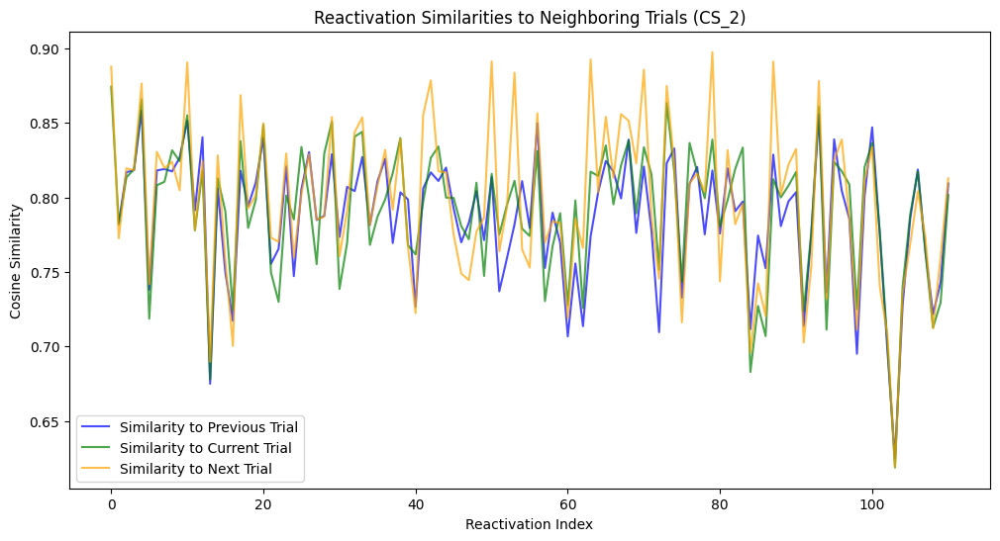

In [ ]:
# Initialize lists to store similarity results
reactivation_to_trial_similarities = []

# Iterate through each reactivation
for r_idx, reactivation in enumerate(mean_activity_r_2):  # Reactivations for CS_1
    trial_idx = trial_r_2[r_idx]  # Get the trial index associated with the reactivation
    
    # Find the neighboring trials (e.g., the current, previous, and next trial means)
    previous_trial_mean = mean_activity_cs_2[trial_idx - 1] if trial_idx > 0 else None
    current_trial_mean = mean_activity_cs_2[trial_idx]
    next_trial_mean = mean_activity_cs_2[trial_idx + 1] if trial_idx < len(mean_activity_cs_2) - 1 else None

    # Calculate cosine similarity for each case
    similarities = {
        "Reactivation Index": r_idx,
        "Trial Index": trial_idx,
        "Similarity to Previous Trial": cosine_similarity(
            reactivation.reshape(1, -1), previous_trial_mean.reshape(1, -1)
        )[0, 0] if previous_trial_mean is not None else np.nan,
        "Similarity to Current Trial": cosine_similarity(
            reactivation.reshape(1, -1), current_trial_mean.reshape(1, -1)
        )[0, 0],
        "Similarity to Next Trial": cosine_similarity(
            reactivation.reshape(1, -1), next_trial_mean.reshape(1, -1)
        )[0, 0] if next_trial_mean is not None else np.nan,
    }
    
    # Append the similarity results for this reactivation
    reactivation_to_trial_similarities.append(similarities)

similarities_df = pd.DataFrame(reactivation_to_trial_similarities)

# Display the similarity results
print(similarities_df.head)
print(len(mean_activity_r_2))

plt.figure(figsize=(12, 6))

# Plot similarities to each trial type
plt.plot(
    similarities_df["Reactivation Index"], similarities_df["Similarity to Previous Trial"],
    label="Similarity to Previous Trial", color="blue", alpha=0.7
)
plt.plot(
    similarities_df["Reactivation Index"], similarities_df["Similarity to Current Trial"],
    label="Similarity to Current Trial", color="green", alpha=0.7
)
plt.plot(
    similarities_df["Reactivation Index"], similarities_df["Similarity to Next Trial"],
    label="Similarity to Next Trial", color="orange", alpha=0.7
)

# Add labels and legend
plt.xlabel("Reactivation Index")
plt.ylabel("Cosine Similarity")
plt.title("Reactivation Similarities to Neighboring Trials (CS_2)")
plt.legend()
plt.show()


In [137]:
# Select top 10% and bottom 10% activations
def get_top_bottom_indices(activity, top_percent=0.1, bottom_percent=0.1):
    num_neurons = activity.shape[1]
    top_n = int(num_neurons * top_percent)
    bottom_n = int(num_neurons * bottom_percent)
    
    top_indices = np.argsort(activity, axis=1)[:, -top_n:]
    bottom_indices = np.argsort(activity, axis=1)[:, :bottom_n]
    
    return top_indices, bottom_indices

# Compute similarity for subsets of neurons
def compute_subset_similarities(mean_activity_r, trial_r, mean_activity_cs, onsets_cs, subset_indices):
    similarities = []

    for r_idx, trial_idx in enumerate(trial_r):
        # Get reactivation activity for the subset
        reactivation_activity = mean_activity_r[r_idx, subset_indices[r_idx]]
        
        # Get mean activity for the previous, current, and next trials
        prev_trial = trial_idx - 1 if trial_idx > 0 else None
        next_trial = trial_idx + 1 if trial_idx < len(mean_activity_cs) - 1 else None
        
        prev_similarity = (
            cosine_similarity(
                reactivation_activity.reshape(1, -1),
                mean_activity_cs[prev_trial, subset_indices[r_idx]].reshape(1, -1),
            )[0, 0]
            if prev_trial is not None
            else np.nan
        )
        
        current_similarity = cosine_similarity(
            reactivation_activity.reshape(1, -1),
            mean_activity_cs[trial_idx, subset_indices[r_idx]].reshape(1, -1),
        )[0, 0]
        
        next_similarity = (
            cosine_similarity(
                reactivation_activity.reshape(1, -1),
                mean_activity_cs[next_trial, subset_indices[r_idx]].reshape(1, -1),
            )[0, 0]
            if next_trial is not None
            else np.nan
        )
        
        similarities.append(
            [r_idx, trial_idx, prev_similarity, current_similarity, next_similarity]
        )
    
    return pd.DataFrame(
        similarities,
        columns=[
            "Reactivation Index",
            "Trial Index",
            "Similarity to Previous Trial",
            "Similarity to Current Trial",
            "Similarity to Next Trial",
        ],
    )

# Top 10% and bottom 10% activations for reactivations
top_indices_r, bottom_indices_r = get_top_bottom_indices(mean_activity_r_1)
top_indices_cs, bottom_indices_cs = get_top_bottom_indices(mean_activity_cs_1)

# Compute similarities for top 10% and bottom 10%
similarities_top_10 = compute_subset_similarities(
    mean_activity_r_1, trial_r_1, mean_activity_cs_1, onsets_cs_1, top_indices_r
)
similarities_bottom_10 = compute_subset_similarities(
    mean_activity_r_1, trial_r_1, mean_activity_cs_1, onsets_cs_1, bottom_indices_r
)


Similarities (Top 10%):
     Reactivation Index  Trial Index  Similarity to Previous Trial  \
0                     0            1                      0.844910   
1                     1            1                      0.869672   
2                     2            1                      0.851158   
3                     3            2                      0.861372   
4                     4            2                      0.856538   
..                  ...          ...                           ...   
134                 134           65                      0.851588   
135                 135           66                      0.861896   
136                 136           66                      0.823228   
137                 137           66                      0.865574   
138                 138           66                      0.882980   

     Similarity to Current Trial  Similarity to Next Trial  
0                       0.825871                  0.846010  
1            

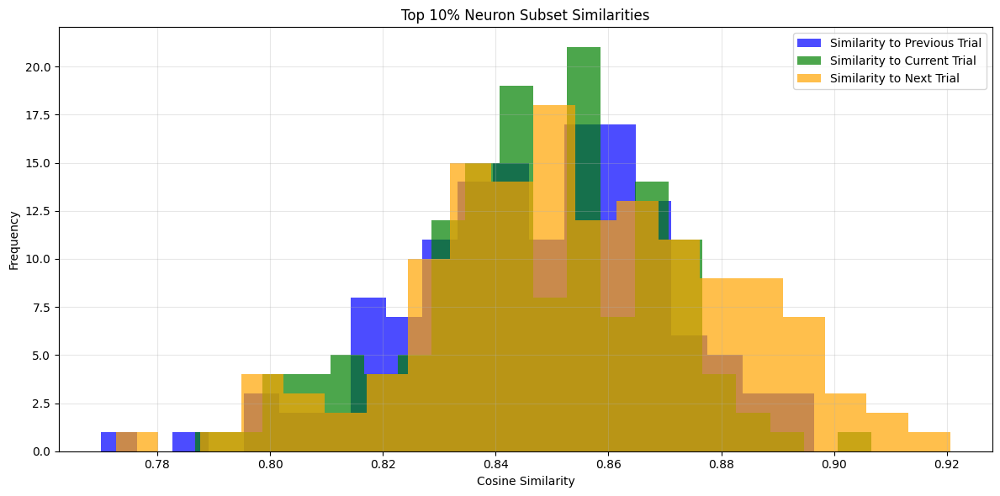

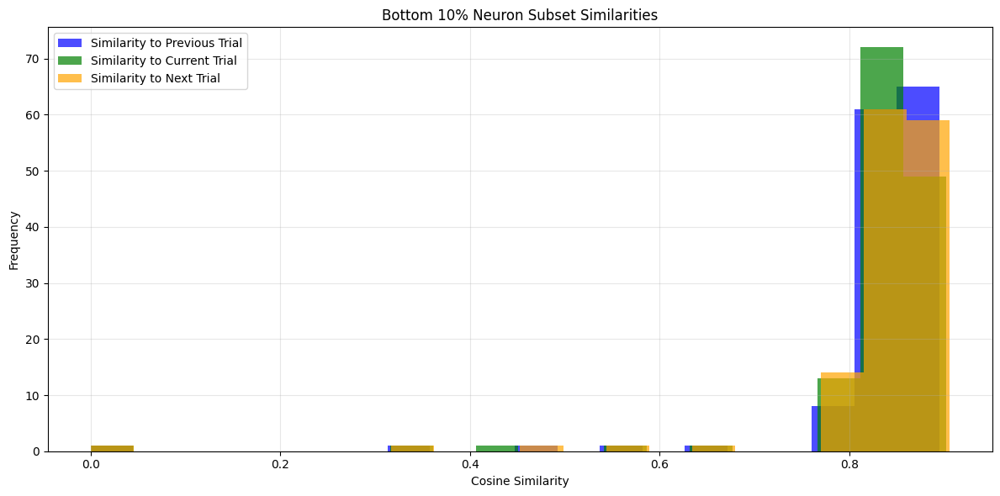

In [ ]:

def plot_similarity_results(similarities, title):
    plt.figure(figsize=(10, 6))

    # Plot similarities
    plt.plot(
        similarities["Trial Index"],
        similarities["Similarity to Previous Trial"],
        label="Similarity to Previous Trial",
        marker="o",
        linestyle="-",
    )
    plt.plot(
        similarities["Trial Index"],
        similarities["Similarity to Current Trial"],
        label="Similarity to Current Trial",
        marker="o",
        linestyle="-",
    )
    plt.plot(
        similarities["Trial Index"],
        similarities["Similarity to Next Trial"],
        label="Similarity to Next Trial",
        marker="o",
        linestyle="-",
    )

    # Customize plot
    plt.title(title)
    plt.xlabel("Trial Index")
    plt.ylabel("Cosine Similarity")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

# Plot results for top 10% neurons
plot_similarity_results(similarities_top_10, "Top 10% Neuron Subset Similarities")

# Plot results for bottom 10% neurons
plot_similarity_results(similarities_bottom_10, "Bottom 10% Neuron Subset Similarities")


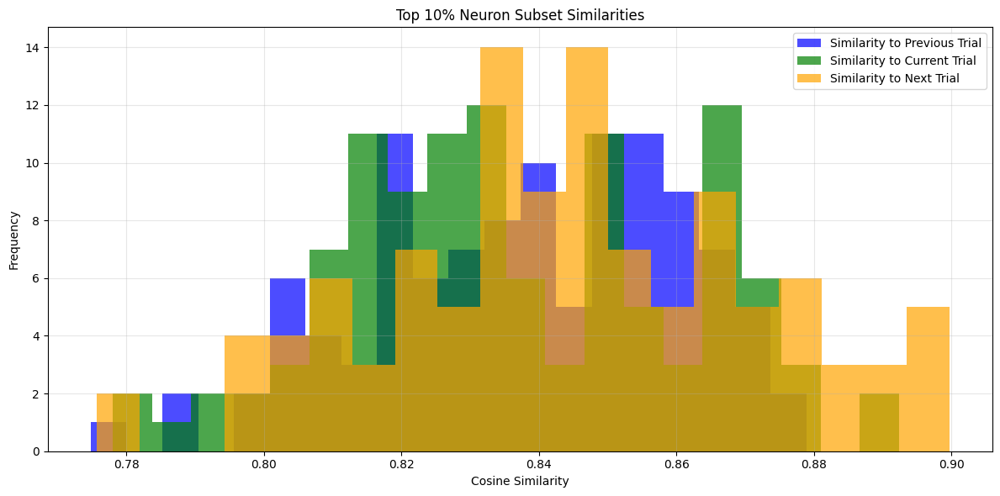

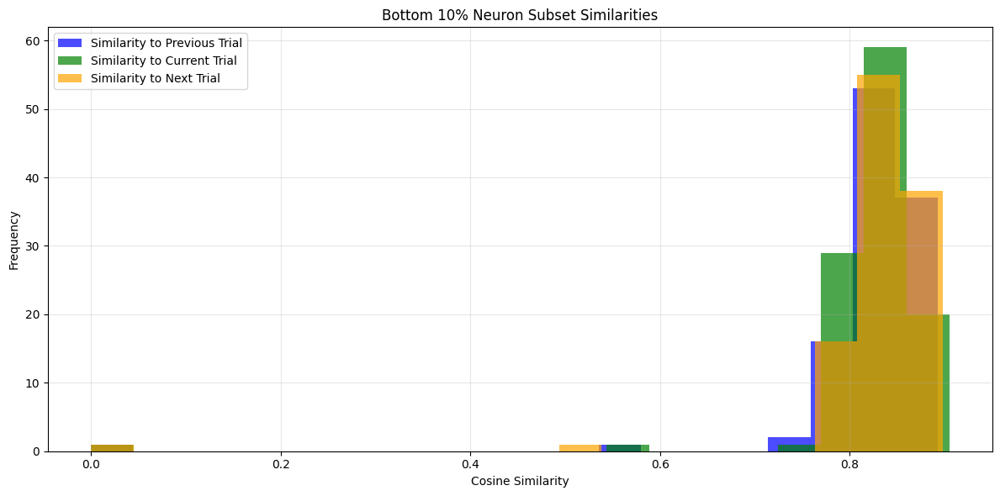

In [140]:
top_indices_r, bottom_indices_r = get_top_bottom_indices(mean_activity_r_2)
top_indices_cs, bottom_indices_cs = get_top_bottom_indices(mean_activity_cs_2)

# Compute similarities for top 10% and bottom 10%
similarities_top_10 = compute_subset_similarities(
    mean_activity_r_2, trial_r_2, mean_activity_cs_2, onsets_cs_2, top_indices_r
)
similarities_bottom_10 = compute_subset_similarities(
    mean_activity_r_2, trial_r_2, mean_activity_cs_2, onsets_cs_2, bottom_indices_r
)

plot_similarity_histograms(similarities_top_10, "Top 10% Neuron Subset Similarities")

# Plot histograms for bottom 10% neurons
plot_similarity_histograms(similarities_bottom_10, "Bottom 10% Neuron Subset Similarities")

In [181]:
def top_10_percent_indices(activity):
    """
    Get the indices of the top 10% most active neurons.
    :param activity: Array of mean activity (trials x neurons or reactivations x neurons)
    :return: Set of indices of the top 10% neurons
    """
    mean_activity = activity.mean(axis=0)  # Average across trials/reactivations
    threshold = np.percentile(mean_activity, 90)  # Top 10% threshold
    top_indices = np.where(mean_activity >= threshold)[0]  # Indices of top 10%
    return set(top_indices)


# Compute top 10% neuron indices
top_cs_1_indices = top_10_percent_indices(mean_activity_cs_1)
top_cs_2_indices = top_10_percent_indices(mean_activity_cs_2)
top_r_1_indices = top_10_percent_indices(mean_activity_r_1)
top_r_2_indices = top_10_percent_indices(mean_activity_r_2)

# Compare overlaps
def compute_overlap(set1, set2):
    """
    Compute overlap between two sets of indices.
    :param set1: Set of indices
    :param set2: Set of indices
    :return: Fractional overlap (intersection size / union size)
    """
    intersection = set1 & set2
    union = set1 | set2
    return len(intersection), len(union), len(intersection) / len(union)  # Overlap, total size, Jaccard index


# Compare and print overlaps
overlap_cs1_r1 = compute_overlap(top_cs_1_indices, top_r_1_indices)
overlap_cs2_r2 = compute_overlap(top_cs_2_indices, top_r_2_indices)
overlap_cs1_cs2 = compute_overlap(top_cs_1_indices, top_cs_2_indices)
overlap_r1_r2 = compute_overlap(top_r_1_indices, top_r_2_indices)
overlap_cs1_r2 = compute_overlap(top_cs_1_indices, top_r_2_indices)
overlap_cs2_r1 = compute_overlap(top_cs_2_indices, top_r_1_indices)

print(f"Overlap between CS_1 and R_1: {overlap_cs1_r1[0]} / {overlap_cs1_r1[1]} (Jaccard: {overlap_cs1_r1[2]:.2f})")
print(f"Overlap between CS_2 and R_2: {overlap_cs2_r2[0]} / {overlap_cs2_r2[1]} (Jaccard: {overlap_cs2_r2[2]:.2f})")
print(f"Overlap between CS_1 and CS_2: {overlap_cs1_cs2[0]} / {overlap_cs1_cs2[1]} (Jaccard: {overlap_cs1_cs2[2]:.2f})")
print(f"Overlap between R_1 and R_2: {overlap_r1_r2[0]} / {overlap_r1_r2[1]} (Jaccard: {overlap_r1_r2[2]:.2f})")
print(f"Overlap between CS_1 and R_2: {overlap_cs1_r2[0]} / {overlap_cs1_r2[1]} (Jaccard: {overlap_cs1_r2[2]:.2f})")
print(f"Overlap between CS_2 and R_1: {overlap_cs2_r1[0]} / {overlap_cs2_r1[1]} (Jaccard: {overlap_cs2_r1[2]:.2f})")



Overlap between CS_1 and R_1: 32 / 594 (Jaccard: 0.05)
Overlap between CS_2 and R_2: 26 / 600 (Jaccard: 0.04)
Overlap between CS_1 and CS_2: 0 / 626 (Jaccard: 0.00)
Overlap between R_1 and R_2: 234 / 392 (Jaccard: 0.60)
Overlap between CS_1 and R_2: 28 / 598 (Jaccard: 0.05)
Overlap between CS_2 and R_1: 22 / 604 (Jaccard: 0.04)


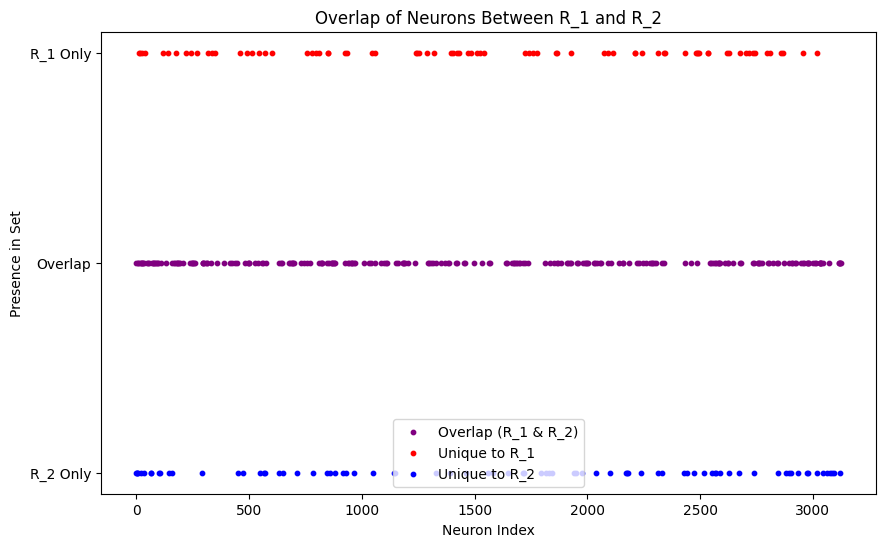

In [153]:
# Identify overlapping and unique neurons
overlap_neurons = top_r_1_indices & top_r_2_indices
unique_r1 = top_r_1_indices - top_r_2_indices
unique_r2 = top_r_2_indices - top_r_1_indices

# Prepare scatter plot data
overlap_indices = list(overlap_neurons)
unique_r1_indices = list(unique_r1)
unique_r2_indices = list(unique_r2)

# Plot the scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(overlap_indices, [1] * len(overlap_indices), color='purple', label='Overlap (R_1 & R_2)', s=10)
plt.scatter(unique_r1_indices, [2] * len(unique_r1_indices), color='red', label='Unique to R_1', s=10)
plt.scatter(unique_r2_indices, [0] * len(unique_r2_indices), color='blue', label='Unique to R_2', s=10)

plt.yticks([0, 1, 2], ['R_2 Only', 'Overlap', 'R_1 Only'])
plt.xlabel("Neuron Index")
plt.ylabel("Presence in Set")
plt.title("Overlap of Neurons Between R_1 and R_2")
plt.legend()
plt.show()


Mean Overlap (R1 vs CS1): 0.06
Mean Overlap (R1 vs CS2): 0.06
Mean Overlap (R2 vs CS1): 0.06
Mean Overlap (R2 vs CS2): 0.06
Mean Overlap (R1 vs R2): 0.11
Mean Overlap (CS1 vs CS2): 0.03


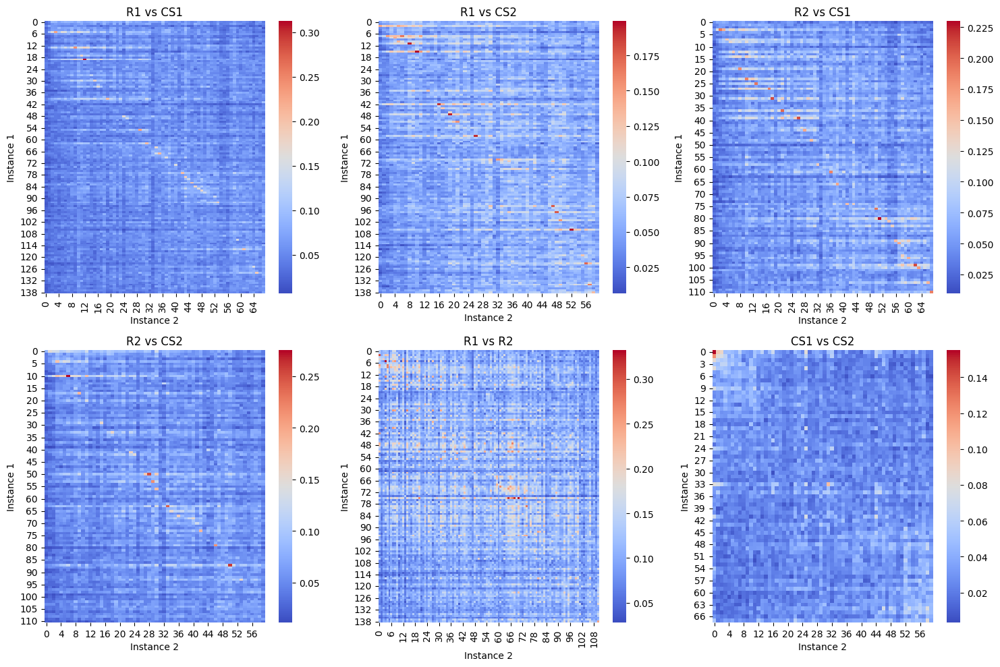

In [150]:
def top_10_percent_indices_per_instance(activity):
    """
    Get the indices of the top 10% most active neurons for each reactivation/trial.
    :param activity: Array of activity (reactivations/trials x neurons)
    :return: List of sets of top 10% indices for each reactivation/trial
    """
    top_indices_list = []
    for i in range(activity.shape[0]):
        threshold = np.percentile(activity[i], 90)  # Top 10% threshold
        top_indices = np.where(activity[i] >= threshold)[0]
        top_indices_list.append(set(top_indices))
    return top_indices_list


def compute_overlap_across_conditions(top_indices_1, top_indices_2):
    """
    Compute overlap across two lists of top neuron indices.
    :param top_indices_1: List of sets (e.g., top neurons for r1 reactivations)
    :param top_indices_2: List of sets (e.g., top neurons for cs1 trials)
    :return: List of overlaps for each pair of reactivation/trial
    """
    overlaps = []
    for set_1 in top_indices_1:
        row_overlap = []
        for set_2 in top_indices_2:
            overlap = len(set_1 & set_2) / len(set_1 | set_2)  # Jaccard index
            row_overlap.append(overlap)
        overlaps.append(row_overlap)
    return np.array(overlaps)


# Get top 10% neuron indices for each instance
top_r1_indices = top_10_percent_indices_per_instance(mean_activity_r_1)  # Reactivations for R1
top_r2_indices = top_10_percent_indices_per_instance(mean_activity_r_2)  # Reactivations for R2
top_cs1_indices = top_10_percent_indices_per_instance(mean_activity_cs_1)  # Trials for CS1
top_cs2_indices = top_10_percent_indices_per_instance(mean_activity_cs_2)  # Trials for CS2

# Compute overlaps for each condition
overlap_r1_cs1 = compute_overlap_across_conditions(top_r1_indices, top_cs1_indices)
overlap_r1_cs2 = compute_overlap_across_conditions(top_r1_indices, top_cs2_indices)
overlap_r2_cs1 = compute_overlap_across_conditions(top_r2_indices, top_cs1_indices)
overlap_r2_cs2 = compute_overlap_across_conditions(top_r2_indices, top_cs2_indices)
overlap_r1_r2 = compute_overlap_across_conditions(top_r1_indices, top_r2_indices)
overlap_cs1_cs2 = compute_overlap_across_conditions(top_cs1_indices, top_cs2_indices)

# Compute mean overlaps for each condition
mean_overlap_r1_cs1 = np.mean(overlap_r1_cs1)
mean_overlap_r1_cs2 = np.mean(overlap_r1_cs2)
mean_overlap_r2_cs1 = np.mean(overlap_r2_cs1)
mean_overlap_r2_cs2 = np.mean(overlap_r2_cs2)
mean_overlap_r1_r2 = np.mean(overlap_r1_r2)
mean_overlap_cs1_cs2 = np.mean(overlap_cs1_cs2)

# Print mean overlaps
print(f"Mean Overlap (R1 vs CS1): {mean_overlap_r1_cs1:.2f}")
print(f"Mean Overlap (R1 vs CS2): {mean_overlap_r1_cs2:.2f}")
print(f"Mean Overlap (R2 vs CS1): {mean_overlap_r2_cs1:.2f}")
print(f"Mean Overlap (R2 vs CS2): {mean_overlap_r2_cs2:.2f}")
print(f"Mean Overlap (R1 vs R2): {mean_overlap_r1_r2:.2f}")
print(f"Mean Overlap (CS1 vs CS2): {mean_overlap_cs1_cs2:.2f}")

# Plot heatmaps
plt.figure(figsize=(15, 10))

conditions = [
    ("R1 vs CS1", overlap_r1_cs1),
    ("R1 vs CS2", overlap_r1_cs2),
    ("R2 vs CS1", overlap_r2_cs1),
    ("R2 vs CS2", overlap_r2_cs2),
    ("R1 vs R2", overlap_r1_r2),
    ("CS1 vs CS2", overlap_cs1_cs2),
]

for i, (title, overlap_matrix) in enumerate(conditions, 1):
    plt.subplot(2, 3, i)
    sns.heatmap(overlap_matrix, cmap="coolwarm", cbar=True)
    plt.title(title)
    plt.xlabel("Instance 2")
    plt.ylabel("Instance 1")

plt.tight_layout()
plt.show()

#how many of  top 10% active in trial/reactivation x are also in the top 10% or trial/reactivation y


In [ ]:
import os
print(os.getcwd())
1

/home/lbeumer/reactivation/Reactivation/normal


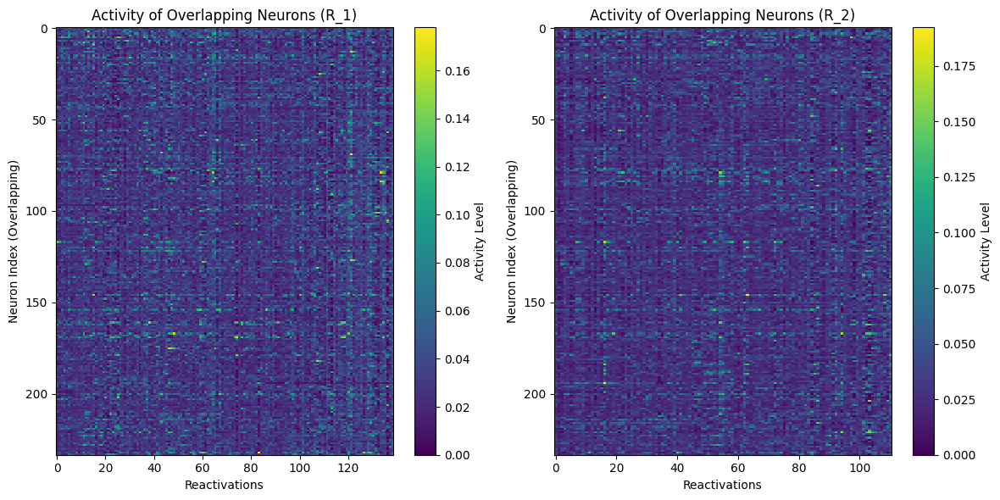

In [154]:
# Identify overlapping neurons
overlap_neurons = list(top_r_1_indices & top_r_2_indices)  # Convert to a list for indexing

# Extract activity of overlapping neurons from `mean_activity_r_1` and `mean_activity_r_2`
overlap_activity_r_1 = mean_activity_r_1[:, overlap_neurons]  # Reactivations x Overlapping Neurons
overlap_activity_r_2 = mean_activity_r_2[:, overlap_neurons]

# Plot activity for overlapping neurons
plt.figure(figsize=(12, 6))

# Heatmap for R_1
plt.subplot(1, 2, 1)
plt.imshow(overlap_activity_r_1.T, aspect='auto', cmap='viridis', interpolation='nearest')
plt.colorbar(label='Activity Level')
plt.title("Activity of Overlapping Neurons (R_1)")
plt.xlabel("Reactivations")
plt.ylabel("Neuron Index (Overlapping)")

# Heatmap for R_2
plt.subplot(1, 2, 2)
plt.imshow(overlap_activity_r_2.T, aspect='auto', cmap='viridis', interpolation='nearest')
plt.colorbar(label='Activity Level')
plt.title("Activity of Overlapping Neurons (R_2)")
plt.xlabel("Reactivations")
plt.ylabel("Neuron Index (Overlapping)")

plt.tight_layout()
plt.show()


# analyzing overlapping 10% reactivation neurons

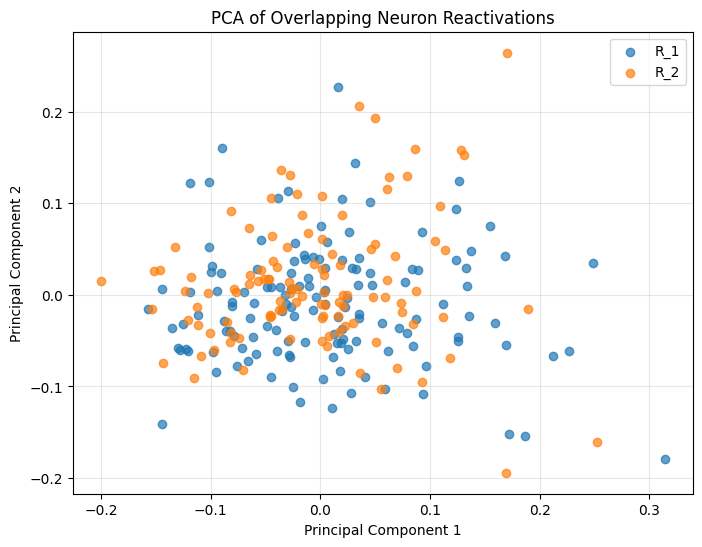

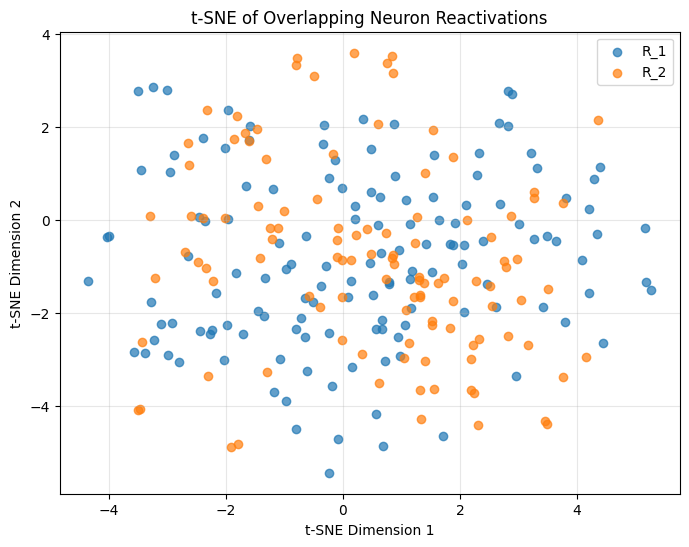

In [155]:
# Combine overlapping activity from R_1 and R_2
combined_overlap_activity = np.vstack([overlap_activity_r_1, overlap_activity_r_2])

# Apply PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(combined_overlap_activity)

# Plot PCA results
plt.figure(figsize=(8, 6))
plt.scatter(pca_result[:overlap_activity_r_1.shape[0], 0], 
            pca_result[:overlap_activity_r_1.shape[0], 1], label="R_1", alpha=0.7)
plt.scatter(pca_result[overlap_activity_r_1.shape[0]:, 0], 
            pca_result[overlap_activity_r_1.shape[0]:, 1], label="R_2", alpha=0.7)
plt.title("PCA of Overlapping Neuron Reactivations")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

# Apply t-SNE
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_result = tsne.fit_transform(combined_overlap_activity)

# Plot t-SNE results
plt.figure(figsize=(8, 6))
plt.scatter(tsne_result[:overlap_activity_r_1.shape[0], 0], 
            tsne_result[:overlap_activity_r_1.shape[0], 1], label="R_1", alpha=0.7)
plt.scatter(tsne_result[overlap_activity_r_1.shape[0]:, 0], 
            tsne_result[overlap_activity_r_1.shape[0]:, 1], label="R_2", alpha=0.7)
plt.title("t-SNE of Overlapping Neuron Reactivations")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.legend()
plt.grid(alpha=0.3)
plt.show()


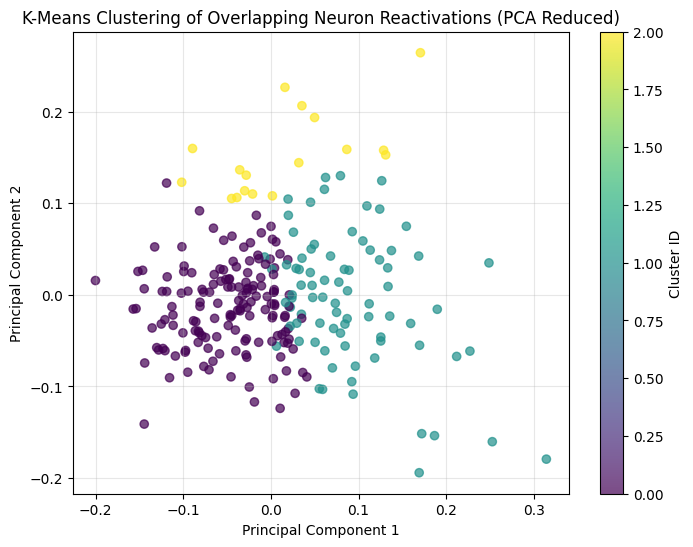

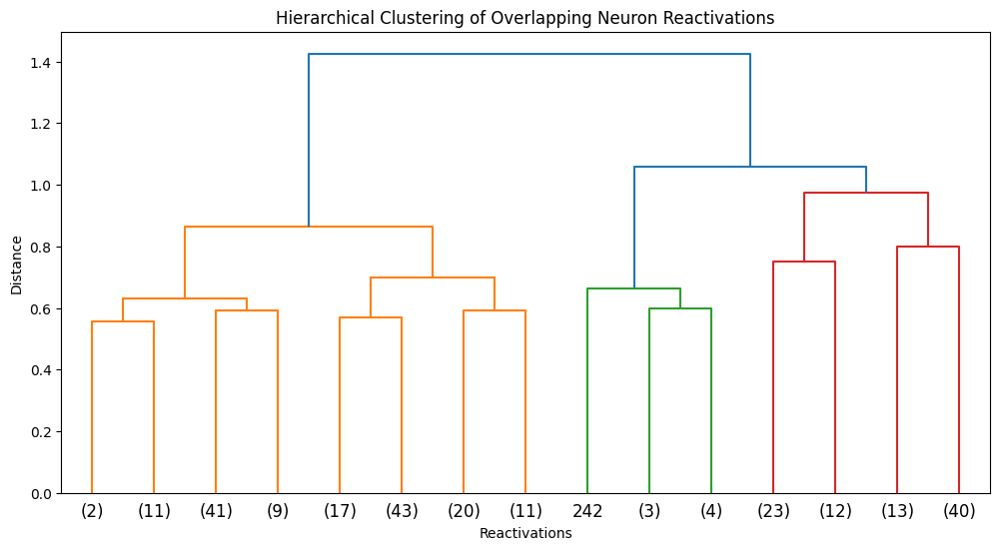

In [156]:
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import dendrogram, linkage

# Apply K-Means
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(combined_overlap_activity)

# Plot clusters
plt.figure(figsize=(8, 6))
plt.scatter(pca_result[:, 0], pca_result[:, 1], c=clusters, cmap="viridis", alpha=0.7)
plt.title("K-Means Clustering of Overlapping Neuron Reactivations (PCA Reduced)")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.colorbar(label="Cluster ID")
plt.grid(alpha=0.3)
plt.show()

# Apply Hierarchical Clustering
linkage_matrix = linkage(combined_overlap_activity, method='ward')
plt.figure(figsize=(12, 6))
dendrogram(linkage_matrix, truncate_mode='level', p=3)
plt.title("Hierarchical Clustering of Overlapping Neuron Reactivations")
plt.xlabel("Reactivations")
plt.ylabel("Distance")
plt.show()


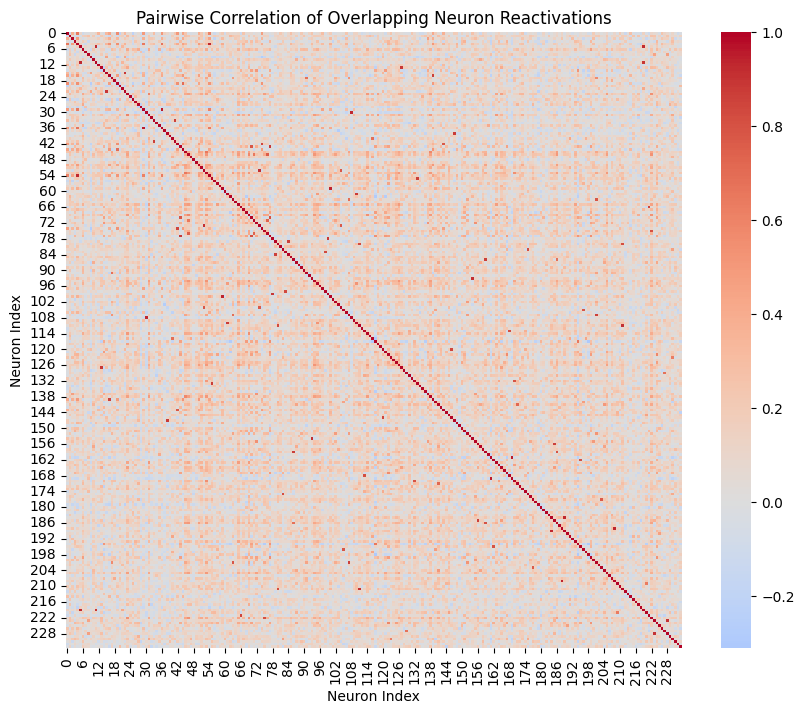

In [157]:
# Compute pairwise correlation
correlation_matrix = np.corrcoef(combined_overlap_activity.T)

# Plot correlation heatmap
import seaborn as sns
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, cmap="coolwarm", center=0, square=True)
plt.title("Pairwise Correlation of Overlapping Neuron Reactivations")
plt.xlabel("Neuron Index")
plt.ylabel("Neuron Index")
plt.show()


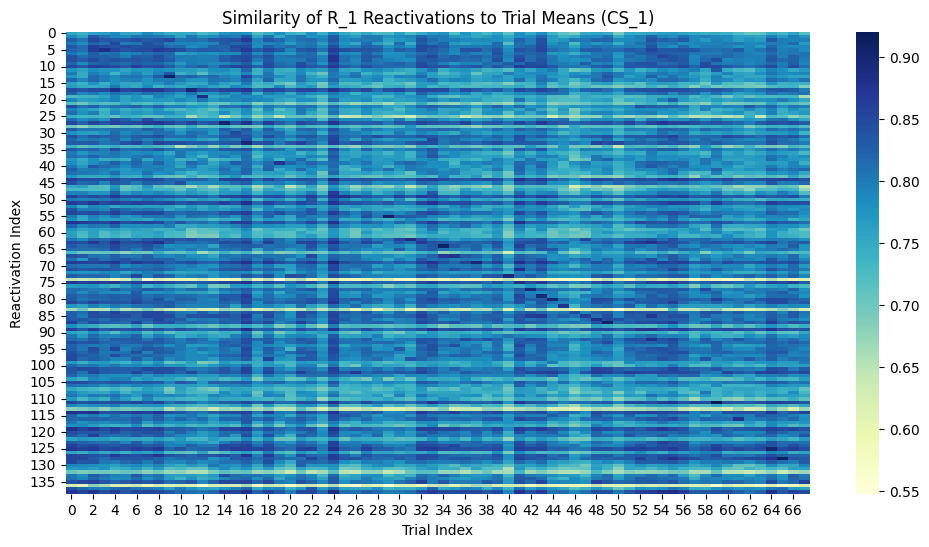

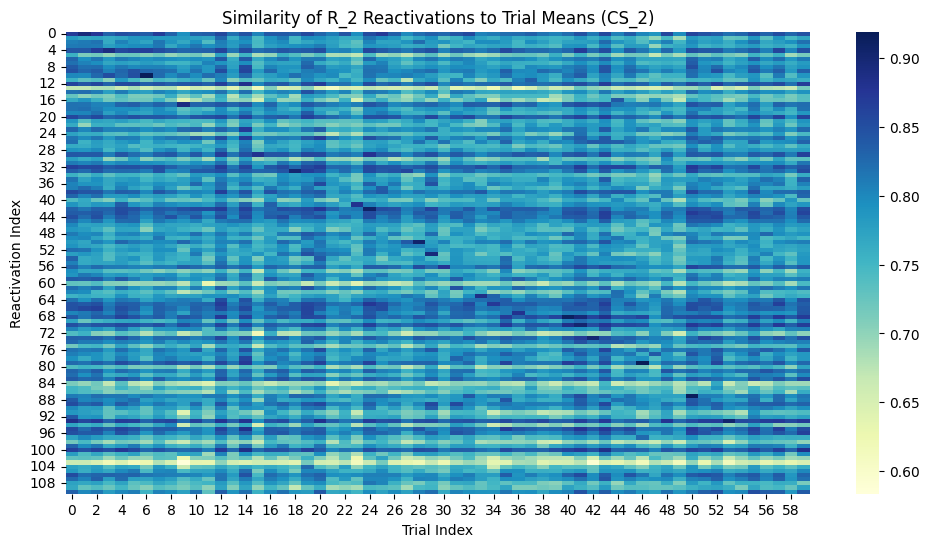

In [160]:


# Subset trial mean activity to include only overlapping neurons
subset_mean_activity_cs_1 = mean_activity_cs_1[:, overlap_neurons]
subset_mean_activity_cs_2 = mean_activity_cs_2[:, overlap_neurons]

# Calculate cosine similarity to trial means
similarity_to_trial_means_r1 = cosine_similarity(overlap_activity_r_1, subset_mean_activity_cs_1)
similarity_to_trial_means_r2 = cosine_similarity(overlap_activity_r_2, subset_mean_activity_cs_2)

# Plot heatmap of similarities for R_1
plt.figure(figsize=(12, 6))
sns.heatmap(similarity_to_trial_means_r1, cmap="YlGnBu", square=False)
plt.title("Similarity of R_1 Reactivations to Trial Means (CS_1)")
plt.xlabel("Trial Index")
plt.ylabel("Reactivation Index")
plt.show()

# Plot heatmap of similarities for R_2
plt.figure(figsize=(12, 6))
sns.heatmap(similarity_to_trial_means_r2, cmap="YlGnBu", square=False)
plt.title("Similarity of R_2 Reactivations to Trial Means (CS_2)")
plt.xlabel("Trial Index")
plt.ylabel("Reactivation Index")
plt.show()


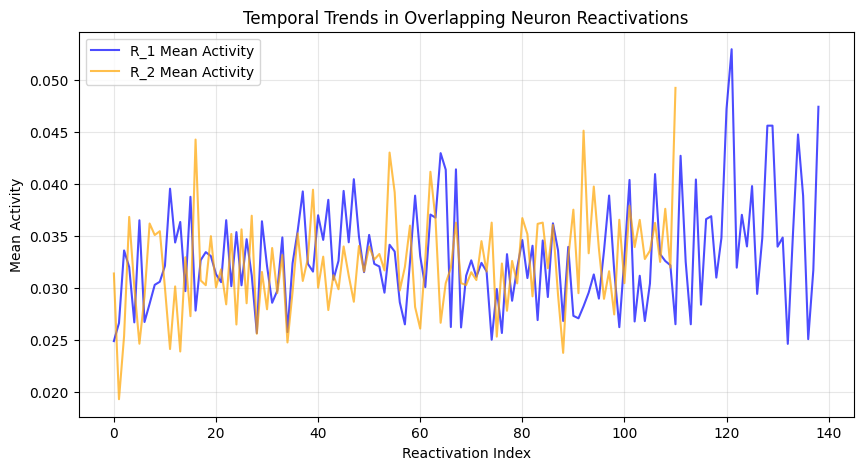

In [161]:
# Create separate time vectors for R_1 and R_2
time_vector_r1 = np.arange(overlap_activity_r_1.shape[0])  # Reactivations for R_1
time_vector_r2 = np.arange(overlap_activity_r_2.shape[0])  # Reactivations for R_2

# Calculate mean activity over time for R_1 and R_2
mean_activity_over_time_r1 = overlap_activity_r_1.mean(axis=1)
mean_activity_over_time_r2 = overlap_activity_r_2.mean(axis=1)

# Plot temporal trends for R_1 and R_2
plt.figure(figsize=(10, 5))
plt.plot(time_vector_r1, mean_activity_over_time_r1, label="R_1 Mean Activity", alpha=0.7, color="blue")
plt.plot(time_vector_r2, mean_activity_over_time_r2, label="R_2 Mean Activity", alpha=0.7, color="orange")
plt.title("Temporal Trends in Overlapping Neuron Reactivations")
plt.xlabel("Reactivation Index")
plt.ylabel("Mean Activity")
plt.legend()
plt.grid(alpha=0.3)
plt.show()


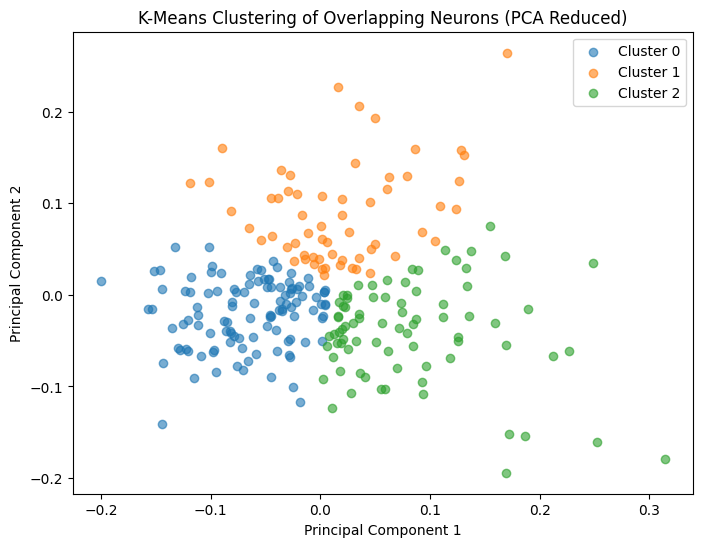

Cluster 0: R_1 vs R_2 Ratio: 61 vs 51
Cluster 1: R_1 vs R_2 Ratio: 28 vs 32
Cluster 2: R_1 vs R_2 Ratio: 50 vs 28


In [162]:
# Combine R_1 and R_2 overlapping neuron activities
combined_reactivations = np.vstack((overlap_activity_r_1, overlap_activity_r_2))
reactivation_labels = np.array([0] * overlap_activity_r_1.shape[0] + [1] * overlap_activity_r_2.shape[0])

# Perform K-Means clustering on PCA-reduced data
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=3, random_state=42).fit(pca_result)
cluster_labels = kmeans.labels_

# Plot clusters
plt.figure(figsize=(8, 6))
for cluster in np.unique(cluster_labels):
    plt.scatter(pca_result[cluster_labels == cluster, 0], pca_result[cluster_labels == cluster, 1],
                label=f'Cluster {cluster}', alpha=0.6)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('K-Means Clustering of Overlapping Neurons (PCA Reduced)')
plt.legend()
plt.show()

# Analyze trial indices associated with each cluster
cluster_trial_indices = [reactivation_labels[cluster_labels == cluster] for cluster in np.unique(cluster_labels)]
for cluster_idx, indices in enumerate(cluster_trial_indices):
    print(f"Cluster {cluster_idx}: R_1 vs R_2 Ratio: {np.sum(indices == 0)} vs {np.sum(indices == 1)}")


T-test: t-statistic = 1.26, p-value = 0.211


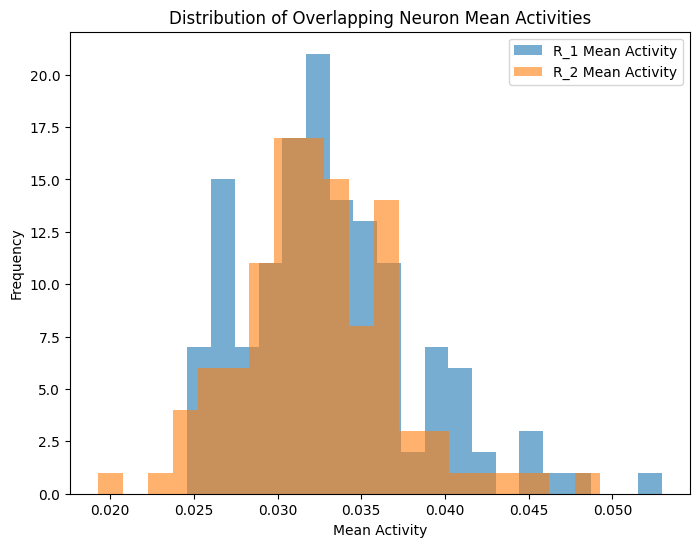

In [163]:
from scipy.stats import ttest_ind

# Compute mean activity of overlapping neurons
mean_activity_r1 = overlap_activity_r_1.mean(axis=1)
mean_activity_r2 = overlap_activity_r_2.mean(axis=1)

# Perform statistical comparison (t-test)
t_stat, p_value = ttest_ind(mean_activity_r1, mean_activity_r2)
print(f"T-test: t-statistic = {t_stat:.2f}, p-value = {p_value:.3f}")

# Plot distributions
plt.figure(figsize=(8, 6))
plt.hist(mean_activity_r1, bins=20, alpha=0.6, label='R_1 Mean Activity')
plt.hist(mean_activity_r2, bins=20, alpha=0.6, label='R_2 Mean Activity')
plt.xlabel('Mean Activity')
plt.ylabel('Frequency')
plt.title('Distribution of Overlapping Neuron Mean Activities')
plt.legend()
plt.show()


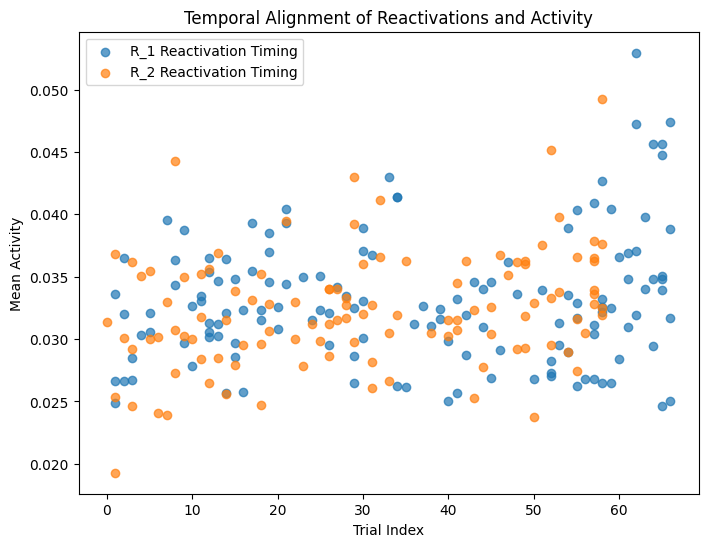

In [164]:
# Compute temporal alignment (e.g., reactivation timing vs trial index)
r1_reactivation_times = np.array(trial_r_1)  # Reactivation times for R_1
r2_reactivation_times = np.array(trial_r_2)  # Reactivation times for R_2

plt.figure(figsize=(8, 6))
plt.scatter(r1_reactivation_times, mean_activity_r1, alpha=0.7, label='R_1 Reactivation Timing')
plt.scatter(r2_reactivation_times, mean_activity_r2, alpha=0.7, label='R_2 Reactivation Timing')
plt.xlabel('Trial Index')
plt.ylabel('Mean Activity')
plt.title('Temporal Alignment of Reactivations and Activity')
plt.legend()
plt.show()


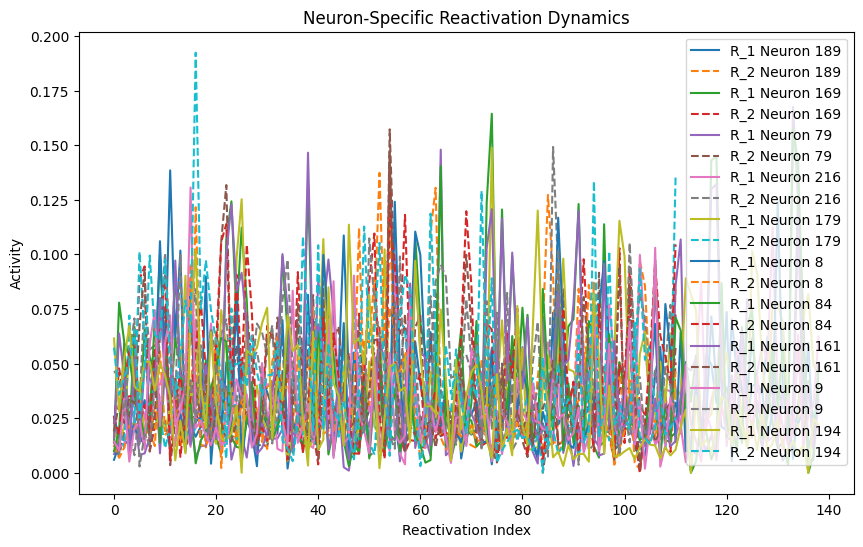

In [165]:
# Compute difference in mean activity for each overlapping neuron
neuron_differences = overlap_activity_r_1.mean(axis=0) - overlap_activity_r_2.mean(axis=0)

# Identify neurons with largest differences
top_neurons = np.argsort(np.abs(neuron_differences))[-10:]

# Plot the activity of these neurons
plt.figure(figsize=(10, 6))
for neuron in top_neurons:
    plt.plot(overlap_activity_r_1[:, neuron], label=f'R_1 Neuron {neuron}')
    plt.plot(overlap_activity_r_2[:, neuron], '--', label=f'R_2 Neuron {neuron}')
plt.xlabel('Reactivation Index')
plt.ylabel('Activity')
plt.title('Neuron-Specific Reactivation Dynamics')
plt.legend()
plt.show()


# analysis whether top stimulus encoding neurons are also in reactivation subset

In [171]:
def normalized_trial_averaged_first_30(activity, behavior, trial_type):
    """
    Makes normalized trial-averaged trace for the first 30 frames for each cue type.
    :param activity: fluorescence (DataFrame)
    :param behavior: dict of behavior
    :param trial_type: type of trial ('cs_1' or 'cs_2')
    :return: trial-averaged activity for the first 30 frames
    """
    #activity = activity.to_numpy()
    index_frames = []
    num_trials = 0
    trial_times = behavior['onsets'][behavior['cue_codes'] == behavior[trial_type + '_code']]
    
    # Gather indices for the first 30 frames of each trial
    for i in trial_times:
        if i > 0:
            num_trials += 1
            for j in range(0, 30):  # Limit to first 30 frames
                index_frames.append(int(i) + j)
    
    # Extract activity for the selected indices
    activity_task_idx = activity[:, index_frames]
    activity_task_idx = np.reshape(activity_task_idx, (activity_task_idx.shape[0], num_trials, 30))
    
    # Compute the mean activity across trials
    activity_task_mean = pd.DataFrame(activity_task_idx.mean(axis=1))
    
    # Normalize by subtracting the baseline (mean of first few frames)
    baseline_frames = behavior['frames_before']  # Adjust if behavior defines a baseline window
    activity_task_mean_df = activity_task_mean.subtract(
        activity_task_mean.iloc[:, :baseline_frames].mean(axis=1), axis=0)
    
    return activity_task_mean_df


# Extract top 10% active neurons based on the mean activity for CS_1 and CS_2
def extract_top_10_percent_neurons(activity_task_mean_df):
    """
    Extract indices of the top 10% active neurons.
    :param activity_task_mean_df: DataFrame of mean activity for neurons
    :return: indices of top 10% neurons
    """
    mean_activity = activity_task_mean_df.mean(axis=1)  # Compute mean activity across frames
    threshold = np.percentile(mean_activity, 90)  # Top 10% threshold
    top_neurons_indices = np.where(mean_activity >= threshold)[0]  # Indices of top 10% neurons
    return top_neurons_indices

mean_activity_cs_1 = normalized_trial_averaged_first_30(activity, behavior, 'cs_1')
mean_activity_cs_2 = normalized_trial_averaged_first_30(activity, behavior, 'cs_2')

top_10_percent_cs_1 = extract_top_10_percent_neurons(mean_activity_cs_1)
top_10_percent_cs_2 = extract_top_10_percent_neurons(mean_activity_cs_2)

print(len(top_10_percent_cs_1), len(top_10_percent_cs_2))



313 313


Overlap between Top 10% CS_1 and R_1 Neurons: 46
Fractional Overlap: 0.08
Overlap between Top 10% CS_2 and R_2 Neurons: 50
Fractional Overlap: 0.09


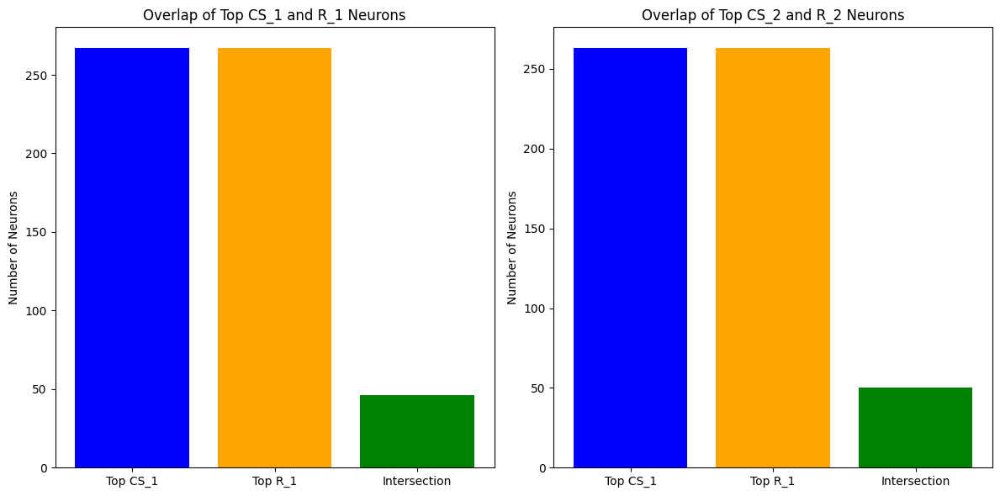

In [173]:
def compute_overlap_indices(set1, set2):
    """
    Compute the overlap between two sets of neuron indices.
    :param set1: Set of indices (e.g., top 10% CS neurons)
    :param set2: Set of indices (e.g., top 10% R neurons)
    :return: Tuple (overlapping indices, overlap fraction)
    """
    intersection = set1 & set2  # Neurons present in both sets
    union = set1 | set2  # All unique neurons in both sets
    overlap_fraction = len(intersection) / len(union) if len(union) > 0 else 0
    return intersection, overlap_fraction


# Convert the arrays to sets for easy comparison
top_cs_1_set = set(top_10_percent_cs_1)
top_cs_2_set = set(top_10_percent_cs_2)
top_r_1_set = set(top_r_1_indices)
top_r_2_set = set(top_r_2_indices)

# Compute overlaps
cs1_r1_overlap, cs1_r1_fraction = compute_overlap_indices(top_cs_1_set, top_r_1_set)
cs2_r2_overlap, cs2_r2_fraction = compute_overlap_indices(top_cs_2_set, top_r_2_set)

# Print Results
print(f"Overlap between Top 10% CS_1 and R_1 Neurons: {len(cs1_r1_overlap)}")
print(f"Fractional Overlap: {cs1_r1_fraction:.2f}")

print(f"Overlap between Top 10% CS_2 and R_2 Neurons: {len(cs2_r2_overlap)}")
print(f"Fractional Overlap: {cs2_r2_fraction:.2f}")

# Visualize overlaps
import matplotlib.pyplot as plt

# Prepare data for plotting
labels = ['Top CS_1', 'Top R_1', 'Intersection']
sizes_cs1_r1 = [len(top_cs_1_set - cs1_r1_overlap), len(top_r_1_set - cs1_r1_overlap), len(cs1_r1_overlap)]
sizes_cs2_r2 = [len(top_cs_2_set - cs2_r2_overlap), len(top_r_2_set - cs2_r2_overlap), len(cs2_r2_overlap)]

# Plot overlaps for CS_1 vs R_1
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.bar(labels, sizes_cs1_r1, color=['blue', 'orange', 'green'])
plt.title("Overlap of Top CS_1 and R_1 Neurons")
plt.ylabel("Number of Neurons")

# Plot overlaps for CS_2 vs R_2
plt.subplot(1, 2, 2)
plt.bar(labels, sizes_cs2_r2, color=['blue', 'orange', 'green'])
plt.title("Overlap of Top CS_2 and R_2 Neurons")
plt.ylabel("Number of Neurons")

plt.tight_layout()
plt.show()


Overlap between CS_1 encoding neurons and R_1: 46 / 580 (Jaccard: 0.08)
Overlap between CS_1 encoding neurons and R_2: 49 / 577 (Jaccard: 0.08)
Overlap between CS_2 encoding neurons and R_2: 50 / 576 (Jaccard: 0.09)
Overlap between CS_2 encoding neurons and R_1: 45 / 581 (Jaccard: 0.08)
Overlap between CS_1 and CS_2 encoding neurons: 108 / 518 (Jaccard: 0.21)


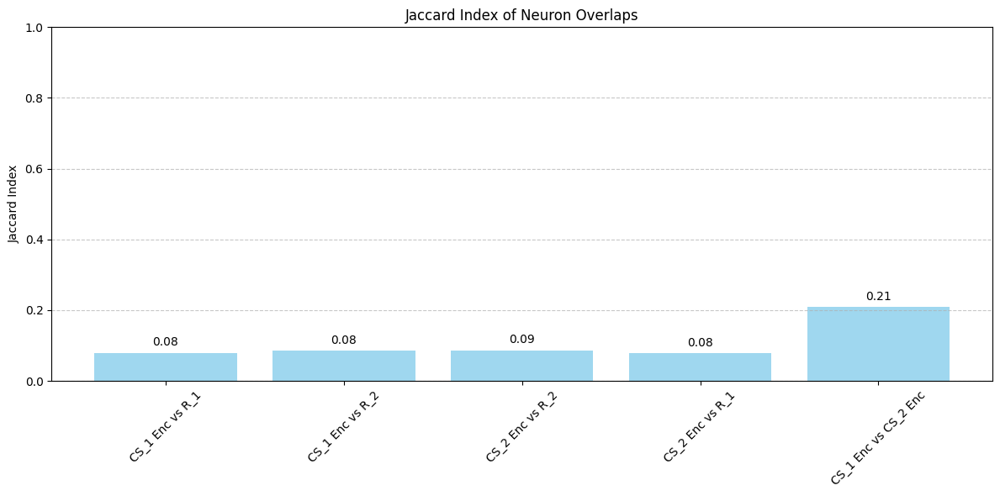

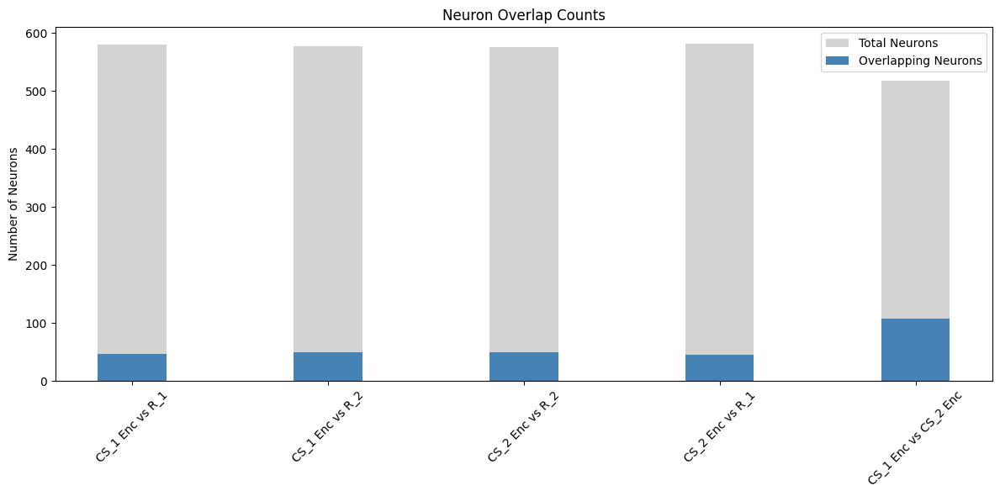

In [174]:
def compute_overlap_indices(set1, set2):
    """
    Compute the overlap between two sets of neuron indices.
    :param set1: Set of indices (e.g., top 10% CS neurons)
    :param set2: Set of indices (e.g., top 10% R neurons)
    :return: Tuple (overlapping indices, overlap fraction)
    """
    intersection = set1 & set2  # Neurons present in both sets
    union = set1 | set2  # All unique neurons in both sets
    overlap_fraction = len(intersection) / len(union) if len(union) > 0 else 0
    return len(intersection), len(union), overlap_fraction


# Convert arrays to sets for easy comparison
top_cs_1_set = set(top_10_percent_cs_1)
top_cs_2_set = set(top_10_percent_cs_2)
top_r_1_set = set(top_r_1_indices)
top_r_2_set = set(top_r_2_indices)

# Compute overlaps for all conditions
overlap_cs1enc_r1 = compute_overlap_indices(top_cs_1_set, top_r_1_set)
overlap_cs1enc_r2 = compute_overlap_indices(top_cs_1_set, top_r_2_set)
overlap_cs2enc_r2 = compute_overlap_indices(top_cs_2_set, top_r_2_set)
overlap_cs2enc_r1 = compute_overlap_indices(top_cs_2_set, top_r_1_set)
overlap_cs1enc_cs2enc = compute_overlap_indices(top_cs_1_set, top_cs_2_set)

# Print results
print(f"Overlap between CS_1 encoding neurons and R_1: {overlap_cs1enc_r1[0]} / {overlap_cs1enc_r1[1]} (Jaccard: {overlap_cs1enc_r1[2]:.2f})")
print(f"Overlap between CS_1 encoding neurons and R_2: {overlap_cs1enc_r2[0]} / {overlap_cs1enc_r2[1]} (Jaccard: {overlap_cs1enc_r2[2]:.2f})")
print(f"Overlap between CS_2 encoding neurons and R_2: {overlap_cs2enc_r2[0]} / {overlap_cs2enc_r2[1]} (Jaccard: {overlap_cs2enc_r2[2]:.2f})")
print(f"Overlap between CS_2 encoding neurons and R_1: {overlap_cs2enc_r1[0]} / {overlap_cs2enc_r1[1]} (Jaccard: {overlap_cs2enc_r1[2]:.2f})")
print(f"Overlap between CS_1 and CS_2 encoding neurons: {overlap_cs1enc_cs2enc[0]} / {overlap_cs1enc_cs2enc[1]} (Jaccard: {overlap_cs1enc_cs2enc[2]:.2f})")

# Prepare data for visualization
conditions = [
    "CS_1 Enc vs R_1",
    "CS_1 Enc vs R_2",
    "CS_2 Enc vs R_2",
    "CS_2 Enc vs R_1",
    "CS_1 Enc vs CS_2 Enc",
]
overlap_sizes = [
    overlap_cs1enc_r1[0],
    overlap_cs1enc_r2[0],
    overlap_cs2enc_r2[0],
    overlap_cs2enc_r1[0],
    overlap_cs1enc_cs2enc[0],
]
total_sizes = [
    overlap_cs1enc_r1[1],
    overlap_cs1enc_r2[1],
    overlap_cs2enc_r2[1],
    overlap_cs2enc_r1[1],
    overlap_cs1enc_cs2enc[1],
]
jaccard_indices = [
    overlap_cs1enc_r1[2],
    overlap_cs1enc_r2[2],
    overlap_cs2enc_r2[2],
    overlap_cs2enc_r1[2],
    overlap_cs1enc_cs2enc[2],
]

# Plot bar chart for Jaccard indices
plt.figure(figsize=(12, 6))
plt.bar(conditions, jaccard_indices, color="skyblue", alpha=0.8)
plt.ylabel("Jaccard Index")
plt.title("Jaccard Index of Neuron Overlaps")
plt.xticks(rotation=45)
plt.ylim(0, 1)
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Annotate bar heights
for i, jaccard in enumerate(jaccard_indices):
    plt.text(i, jaccard + 0.02, f"{jaccard:.2f}", ha="center", fontsize=10)

plt.tight_layout()
plt.show()

# Plot overlapping and total sizes
plt.figure(figsize=(12, 6))
bar_width = 0.35
indices = np.arange(len(conditions))

plt.bar(indices, total_sizes, bar_width, label="Total Neurons", color="lightgray")
plt.bar(indices, overlap_sizes, bar_width, label="Overlapping Neurons", color="steelblue")

plt.ylabel("Number of Neurons")
plt.title("Neuron Overlap Counts")
plt.xticks(indices, conditions, rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


# Modeling future responses

# Untangling Hypothesis